# **Project 3**, APS1070 Fall 2021
#### **PCA [10 marks]**
**Deadline: Nov 5th, 21:00**

**Academic Integrity**

This project is individual - it is to be completed on your own. If you have questions, please post your query in the APS1070 Piazza Q&A forums (the answer might be useful to others!).

Do not share your code with others, or post your work online. Do not submit code that you have not written yourself. Students suspected of plagiarism on a project, midterm or exam will be referred to the department for formal discipline for breaches of the Student Code of Conduct.

Please fill out the following:


*   **Name**: Juliano Zhu
*   **Student number**: 1003976502



In this project we work on a Covid-19 dataset that reports the number  cases for different countries at the end of each day.

# Part 1: Getting started [1 Marks]

In [ ]:
import pandas as pd
cases_raw = pd.read_csv(
    filepath_or_buffer='https://raw.githubusercontent.com/aps1070-2019/datasets/master/confirmed-june21.csv',
    index_col=0,
    thousands=','
)

1. Write a function to do the following: **[0.25]**
    * Takes the dataframe, and your country list as inputs (US, China, Canada, ...)
    * Plots time-series for the input list (it is best to plot each country in a separate graph (subplot), so you can easily compare them.)
    
2. Apply `StandardScalar` to the data. Each day should have a `mean` of zero and a `StD` of 1. **[0.25]**
3. Run the function in `step 1` on the standardized dataset for the `US`, `China`, and `Canada`.   **[0.25]**
4. Discuss the trends in the standardized time-series for the `US`, `Canada`, and `China`. What does it mean if the curve goes up or down (are the number of covid cases negative?) What does the sign of values indicate? **[0.25]**

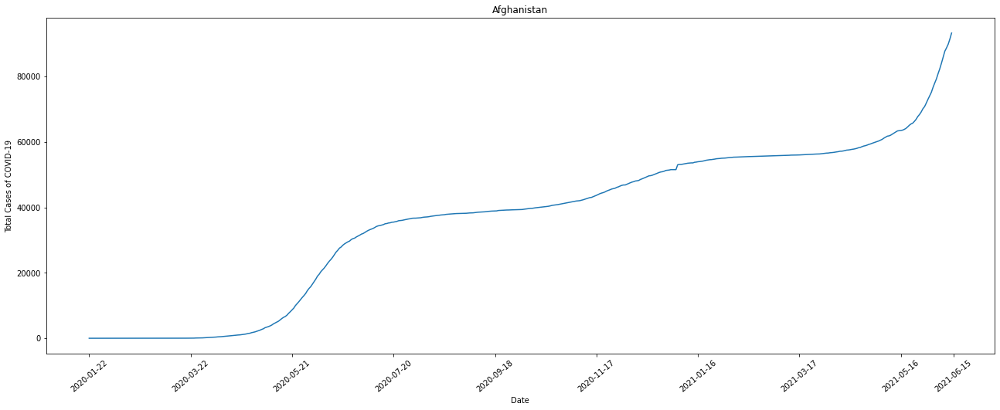

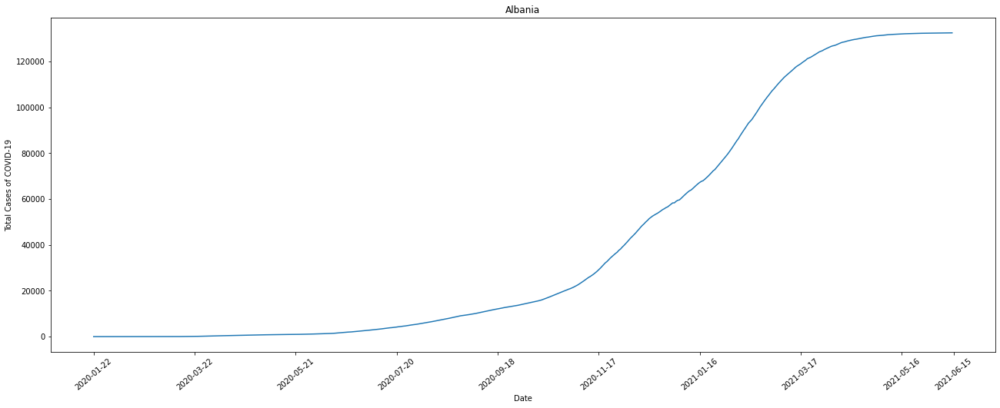

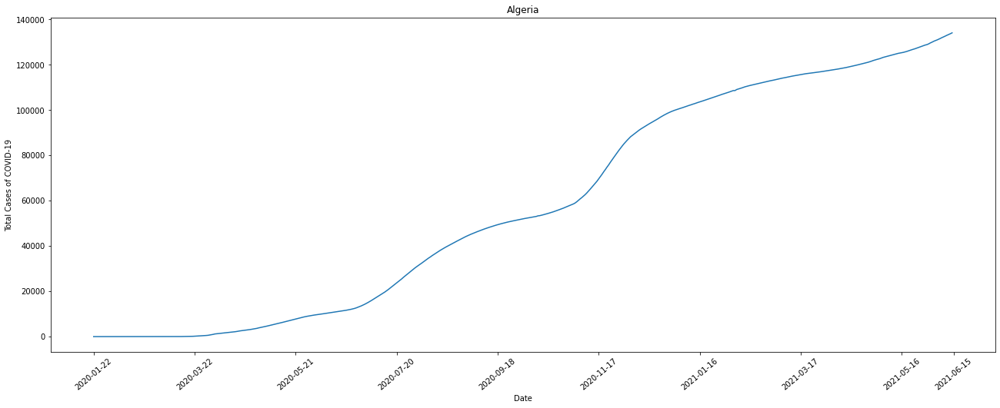

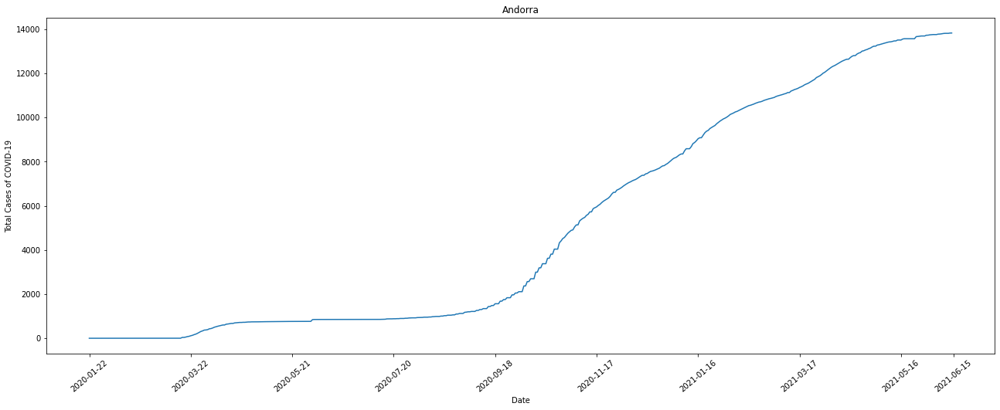

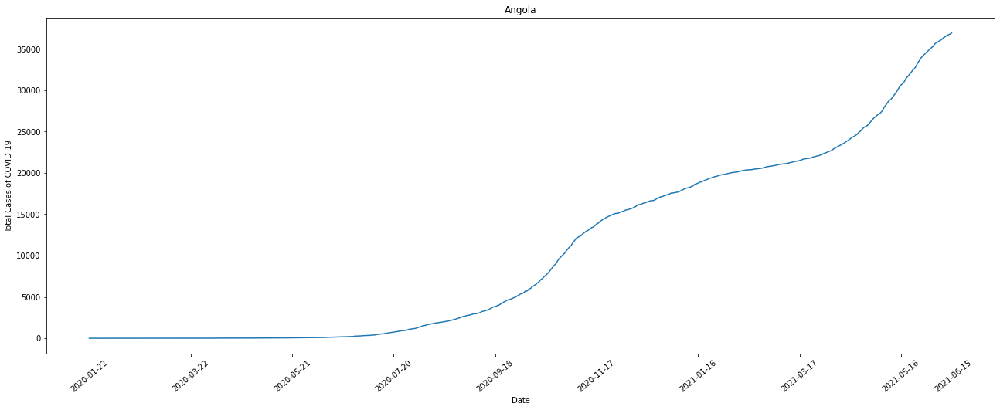

...

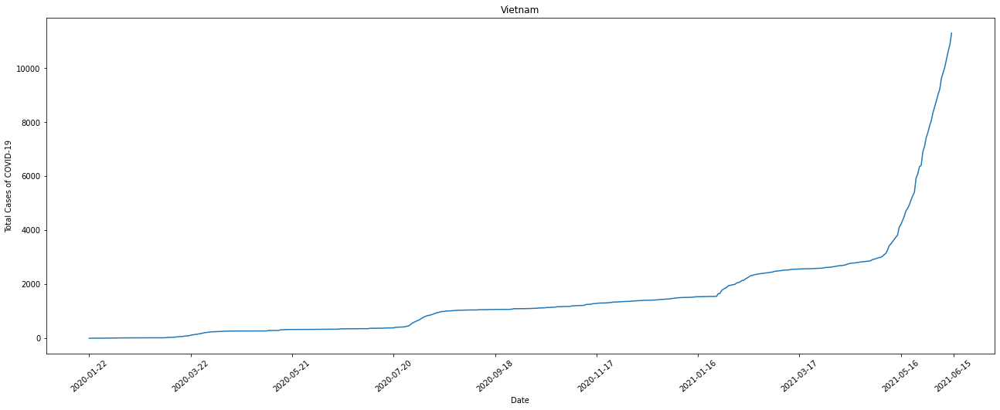

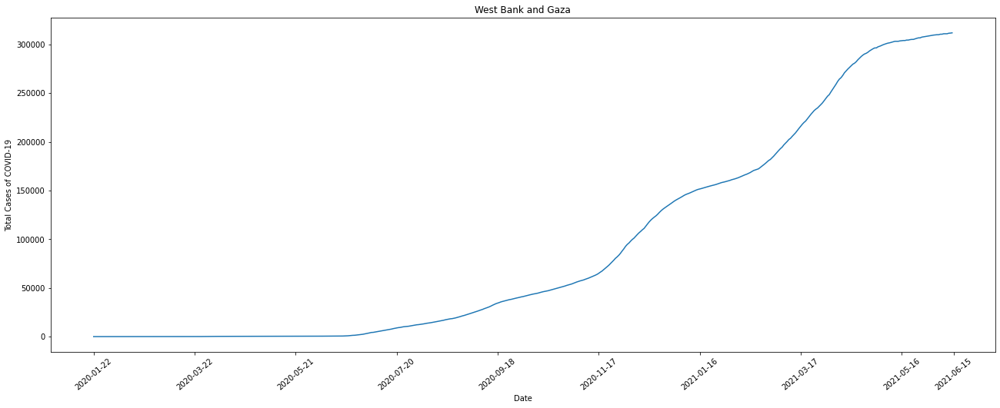

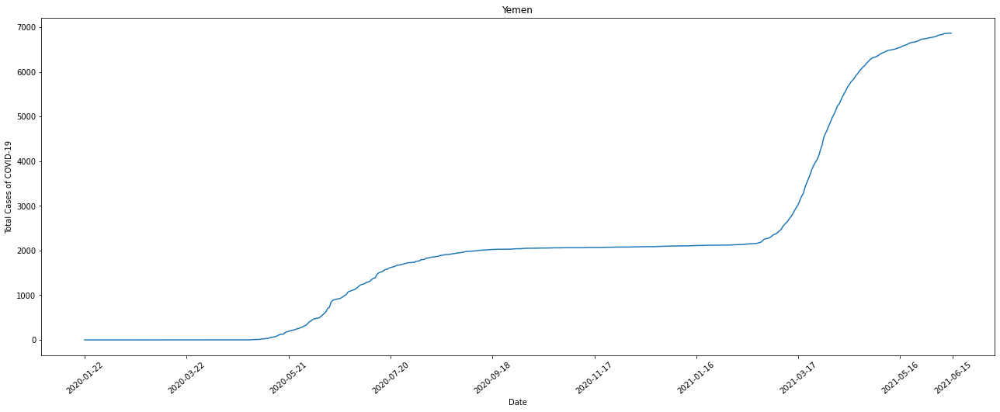

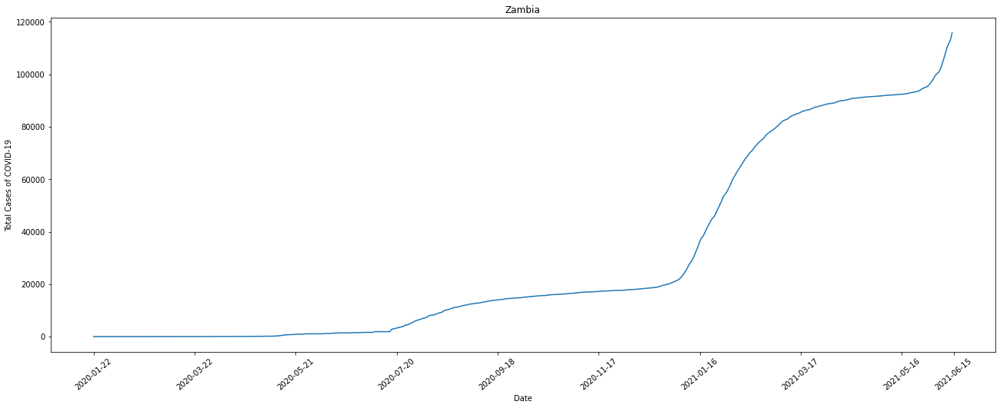

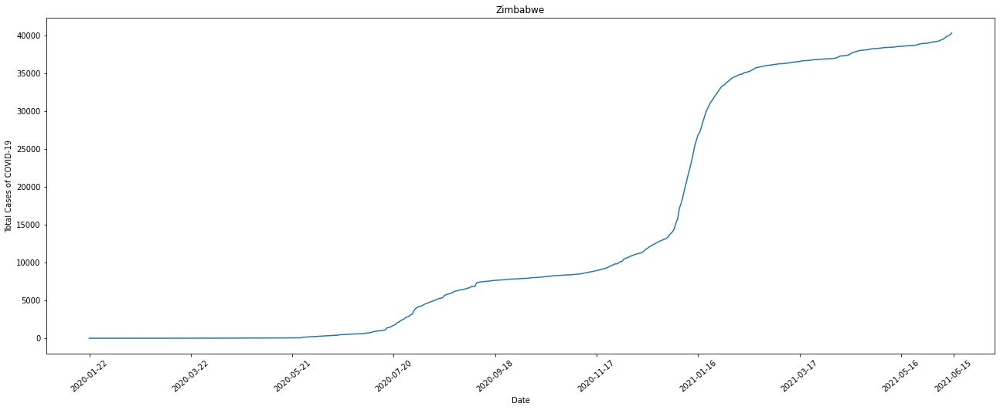

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
df = cases_raw.copy()
country_list = df.index.values

for j in country_list:
  figl, ax = plt.subplots(figsize = (22,8))
  ax.plot(df.columns, df.loc[j])
  xticks=list(range(0, len(df.columns), 60))
  xlabels=[df.columns[x] for x in xticks]
  xticks.append(len(df.columns))
  xlabels.append(df.columns[-1])
  ax.set_xticks(xticks)
  ax.set_xticklabels(xlabels, rotation=40)

  ax.set_title(j)
  ax.set_xlabel('Date')
  ax.set_ylabel('Total Cases of COVID-19')
  plt.show()

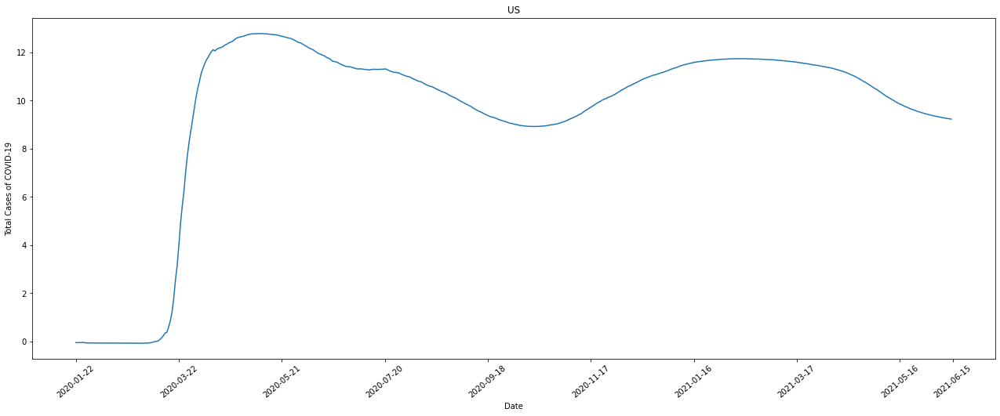

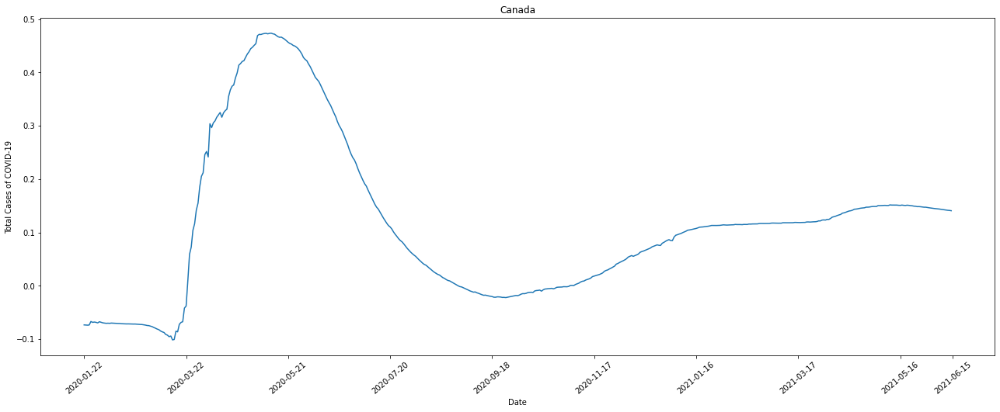

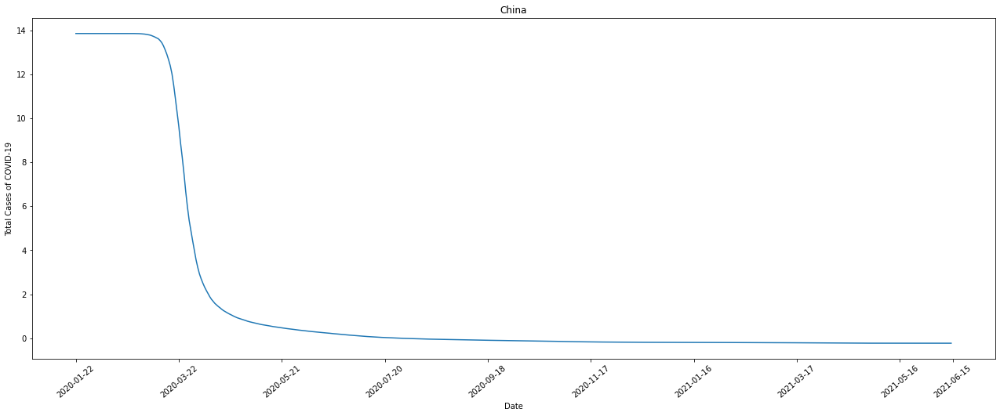

In [ ]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaled_data = StandardScaler().fit_transform(df)
scaled_data = pd.DataFrame(data = scaled_data, columns = df.columns, index = df.index.values)
for j in ['US', 'Canada', 'China']:
  figl, ax = plt.subplots(figsize = (22,8))
  ax.plot(scaled_data.columns, scaled_data.loc[j])
  xticks=list(range(0, len(scaled_data.columns), 60))
  xlabels=[scaled_data.columns[x] for x in xticks]
  xticks.append(len(scaled_data.columns))
  xlabels.append(scaled_data.columns[-1])
  ax.set_xticks(xticks)
  ax.set_xticklabels(xlabels, rotation=40)
  ax.set_title(j)
  ax.set_xlabel('Date')
  ax.set_ylabel('Total Cases of COVID-19')
  plt.show()

After standardized, cases in US increased significantly starting from March 20 and kept increasing until May 20, then slowly decreased. The curve shows that the total number of case(with standardized value around 10) in US is much higher than the average level of the world.

In China, it shows a sharp decrease trend strating from March 10. The curve was flat until the May. At beginning, the total number of case(with maximum standardized value of 14) in China was the highest among the three counties, and significantly greatwe than the averge level, and then it decreased to the average level.

In Canada, the curve started from a slight decrease trend(Jan 22 to Mar 20), then increased until May 10. After that, a trend of slight recovery following a large decrease happened. The total number of case(around 0.1) in Canada is always around the average case level in the world.

When the sign of the standardized case is positive, the cases in the country is greater than the world average level. When the sign of the standardized case is negative, the cases in the country is less than the world average level.


# Part 2: Applying PCA [2 Marks]

1. Compute the covariance matrix of the dataframe. *Hint: The dimensions of your covariance matrix should be (511, 511).* **[0.25]**
2. Write a function `get_sorted_eigen(df_cov)` that gets the covariance matrix of dataframe `df` (from step 1), and returns sorted eigenvalues and eigenvectors using `np.linalg.eigh`. **[0.25]**
3. Show the effectiveness of your principal components in covering the variance of the dataset with a `scree plot`. **[0.25]**
4. How many PCs do you need to cover 99% of the dataset's variance? **[0.25]**
5. Plot the first 16 principal components (Eigenvectors) as a time series (16 subplots, on the x-axis you have dates and on the y-axis you have the value of the PC element) . **[0.5]**
6. Compare the first few PCs with the rest of them. Do you see any difference in their trend? **[0.5]**

/usr/local/lib/python3.7/dist-packages/matplotlib/transforms.py:789: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.array(args, dtype=float).reshape(2, 2)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/matplotlib/transforms.py:789: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.array(args, dtype=float).reshape(2, 2)


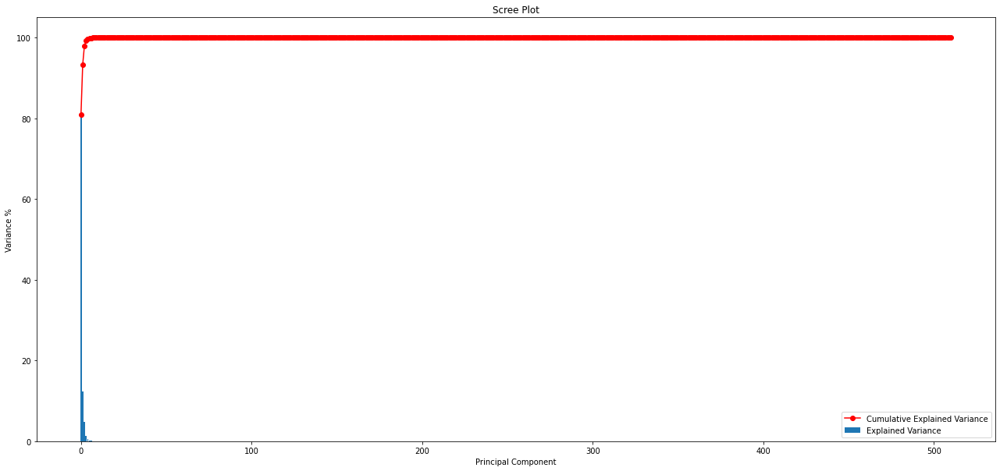

In [ ]:
#1-3.
import numpy as np
df_cov = np.cov(scaled_data.T)
def get_sorted_eigen(df_cov):
  eigenValues, eigenVectors = np.linalg.eig(df_cov)  
  args = (-eigenValues).argsort()
  eigenValues = eigenValues[args]
  eigenVectors = eigenVectors[:, args]
  return eigenValues, eigenVectors

eigenValues, eigenVectors = get_sorted_eigen(df_cov)

eigenValues_sum = eigenValues.sum()
Var_ratio = [eigV/eigenValues_sum*100 for eigV in eigenValues]
cumVar_ratio = np.cumsum(Var_ratio)

PC_values = np.arange(len(eigenValues)) + 1
plt.figure(figsize=(22,10))
plt.bar(range(df.shape[1]), Var_ratio, label='Explained Variance')
plt.plot(cumVar_ratio, 'r-o', label='Cumulative Explained Variance')
plt.legend()
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance %')
plt.show()

In [ ]:
#4 PCs can cover 99% of the dataset's variance
print(cumVar_ratio[:10])


[80.95992954-8.70345353e-31j 93.23953264-1.00235505e-30j
 97.96647351-1.05317119e-30j 99.24896476-1.06695838e-30j
 99.70668524-1.07187902e-30j 99.8306911 -1.07321213e-30j
 99.90443943-1.07400494e-30j 99.93772792-1.07436281e-30j
 99.96737827-1.07468156e-30j 99.97900054-1.07480650e-30j]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


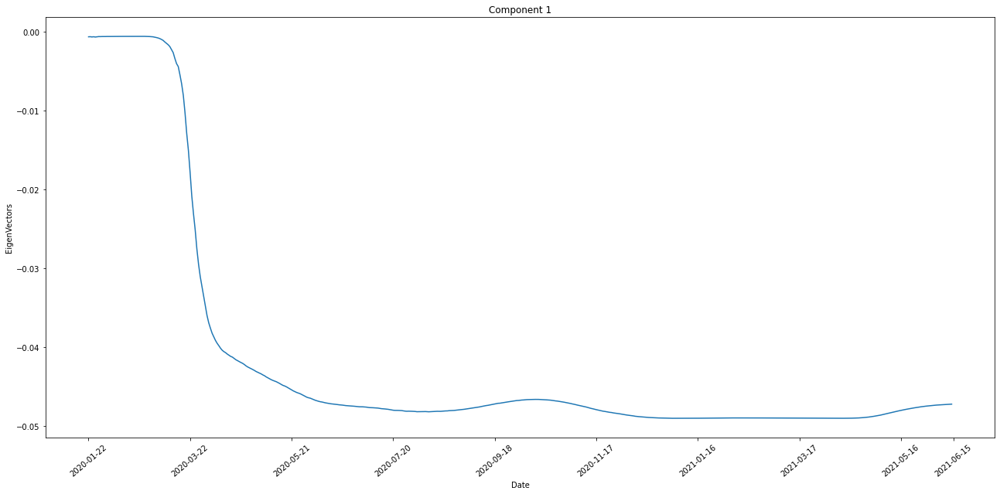

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


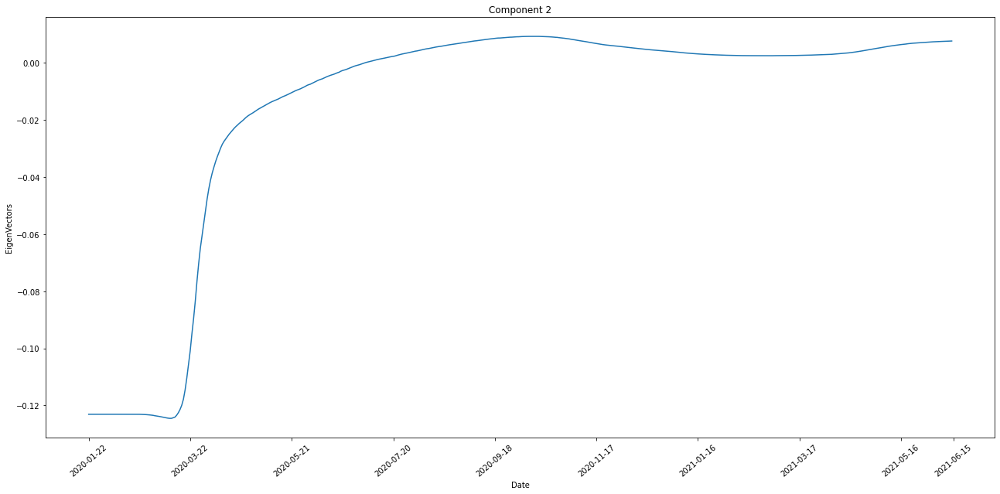

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


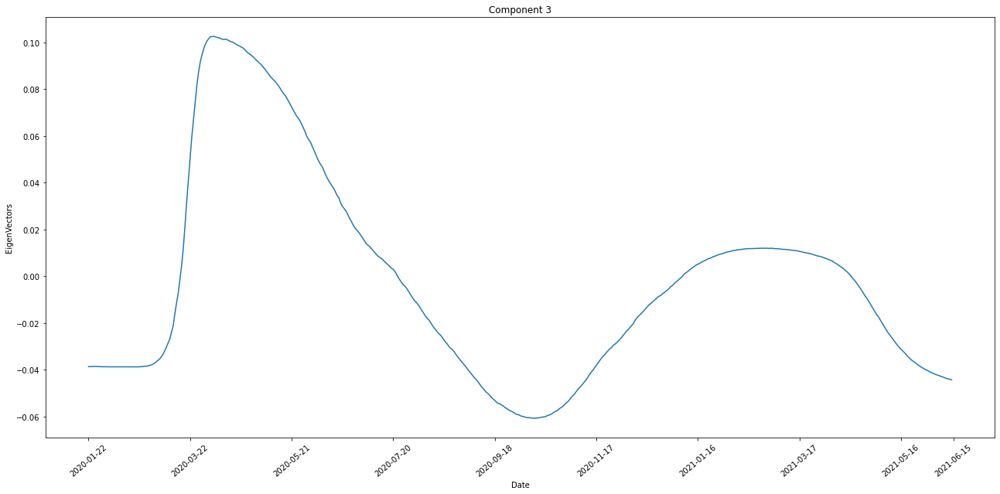

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


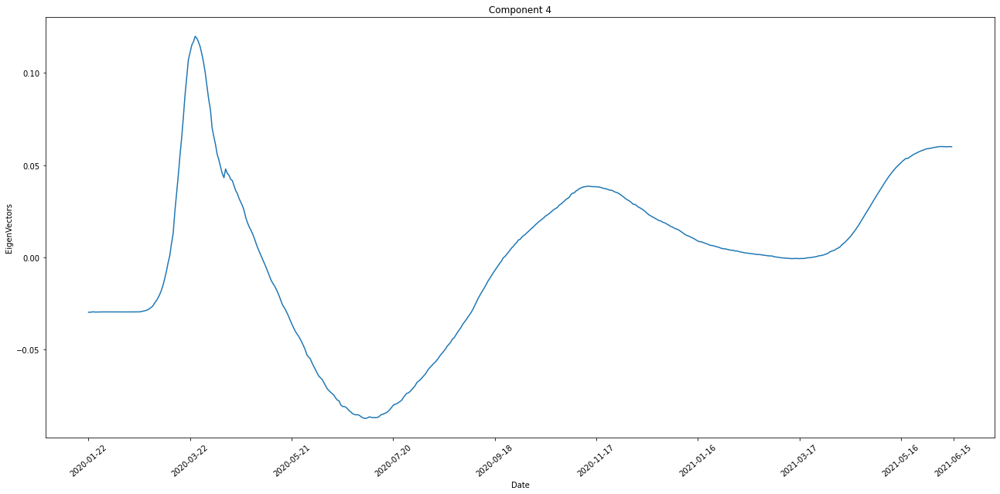

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


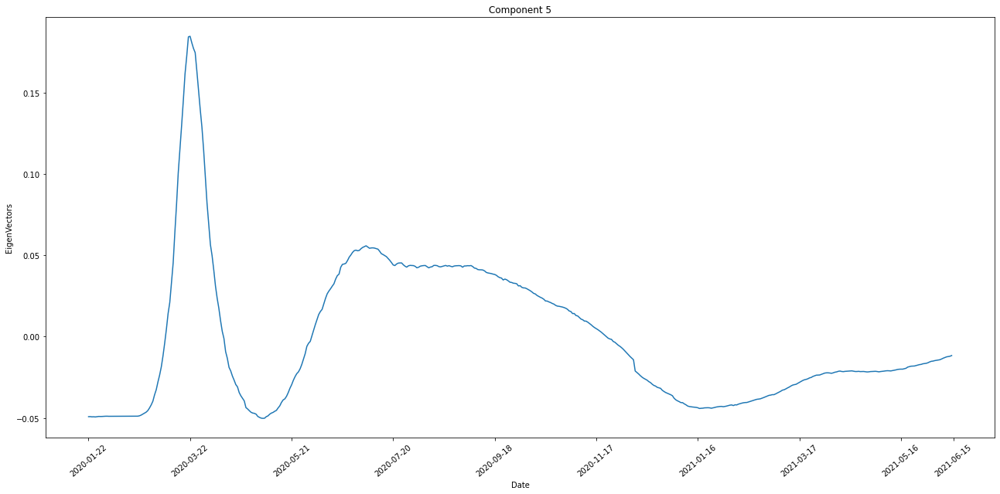

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


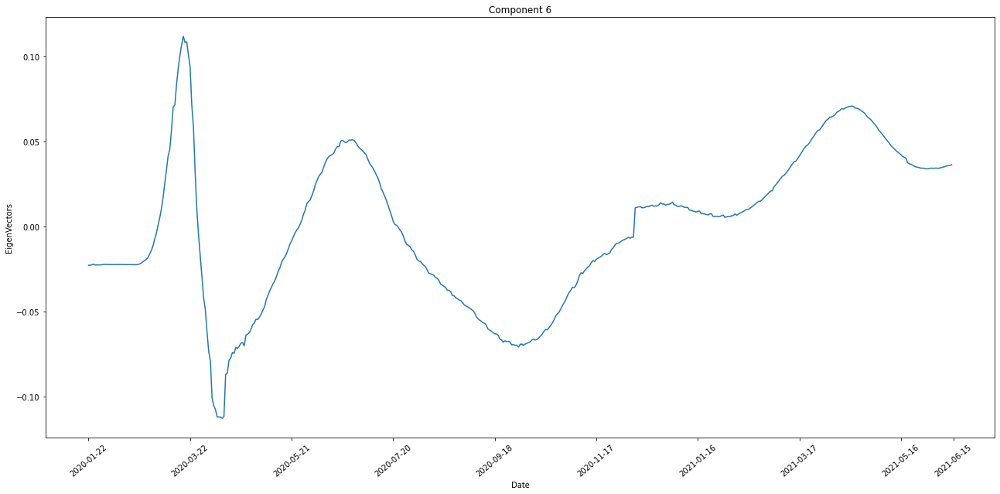

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


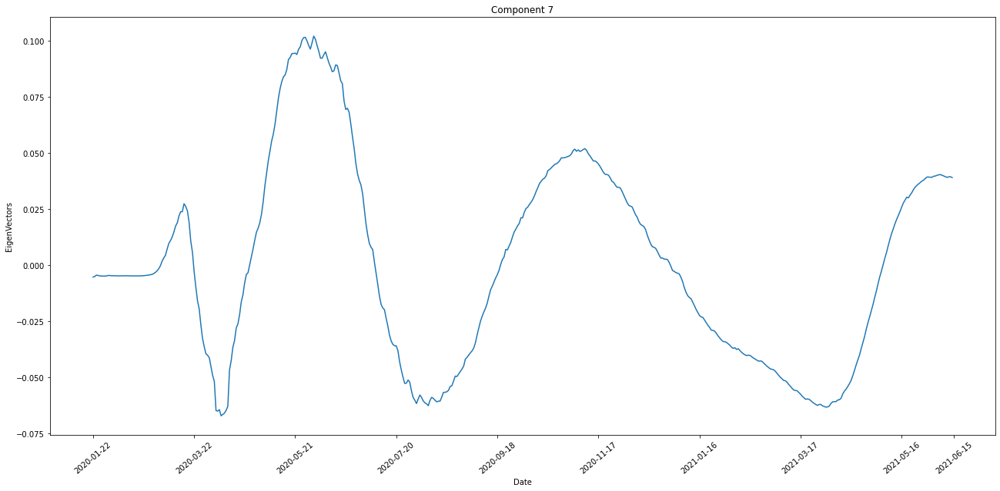

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


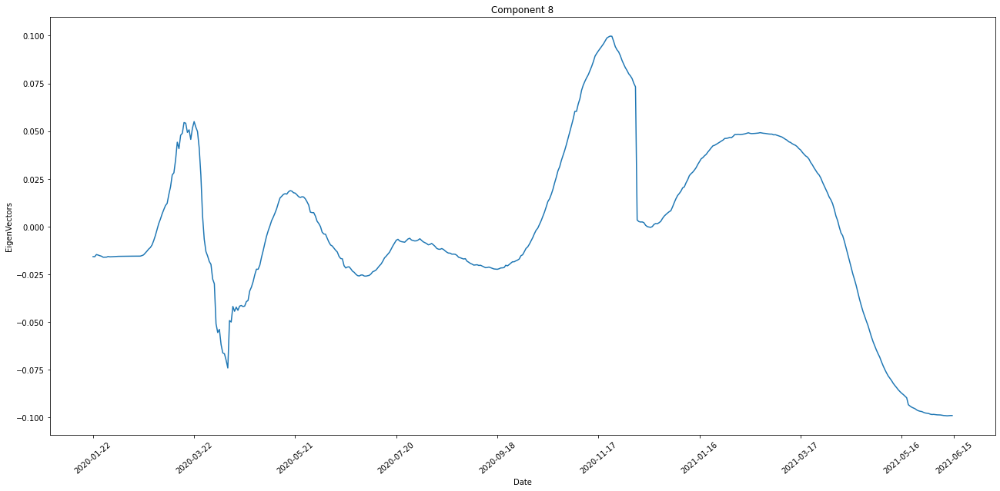

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


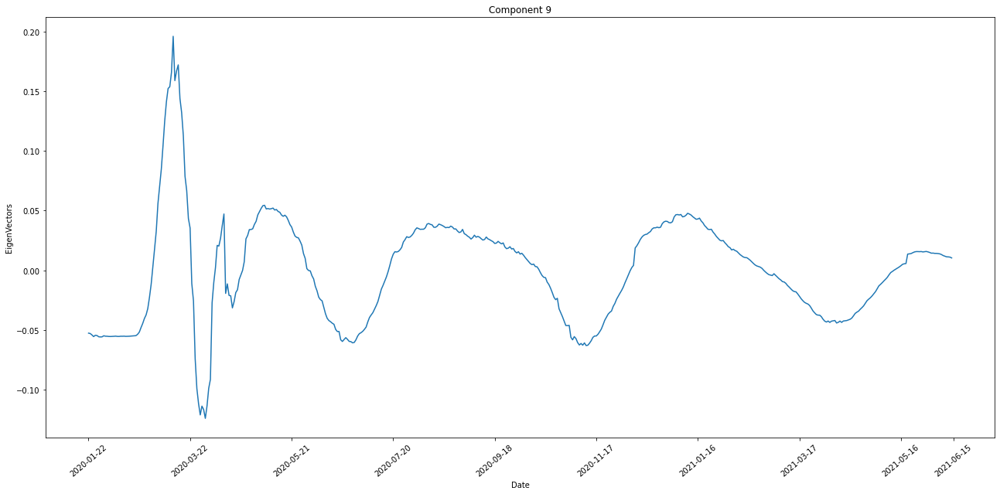

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


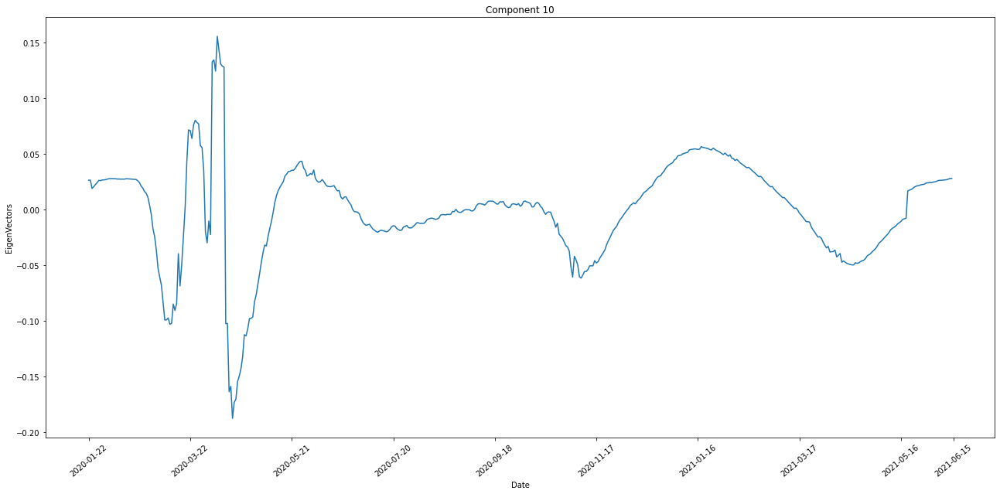

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


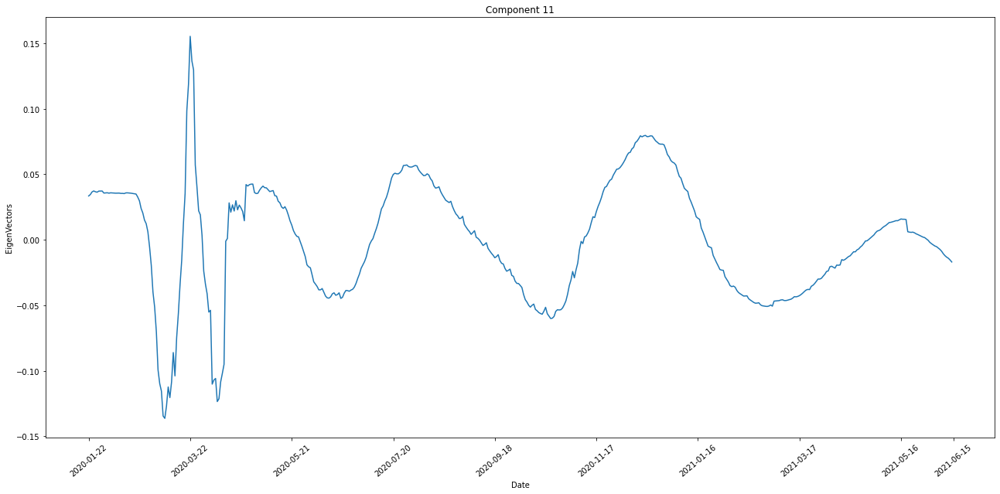

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


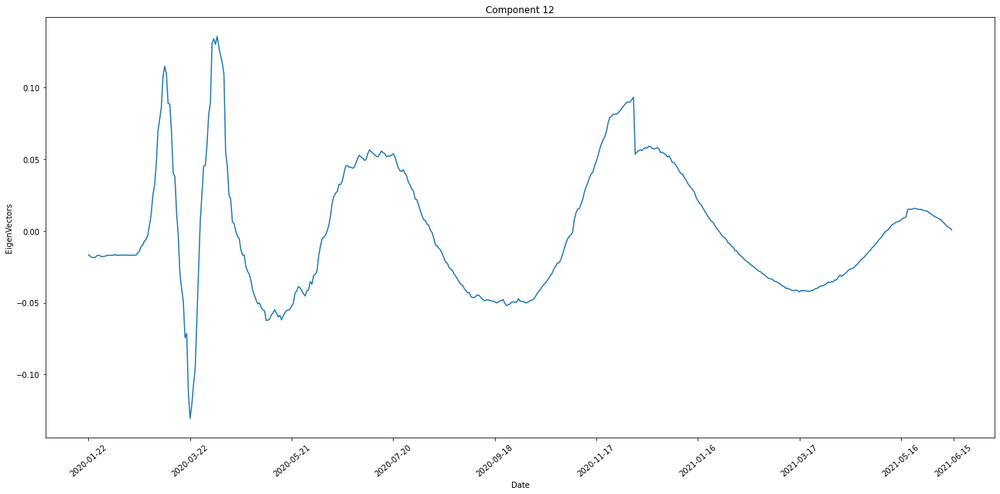

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


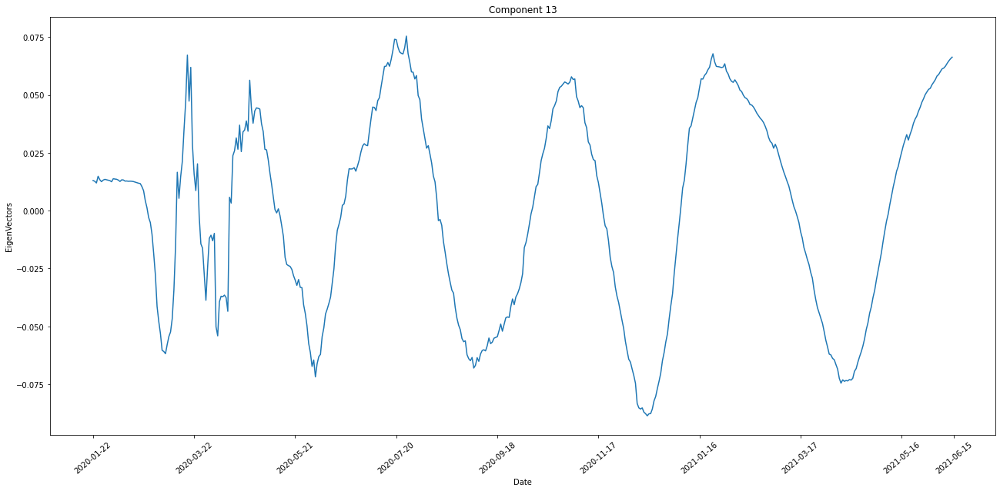

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


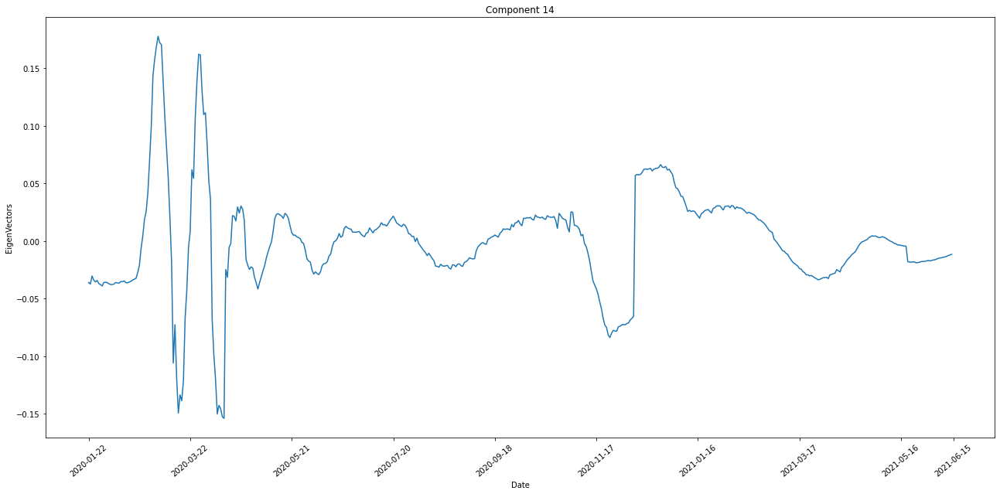

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


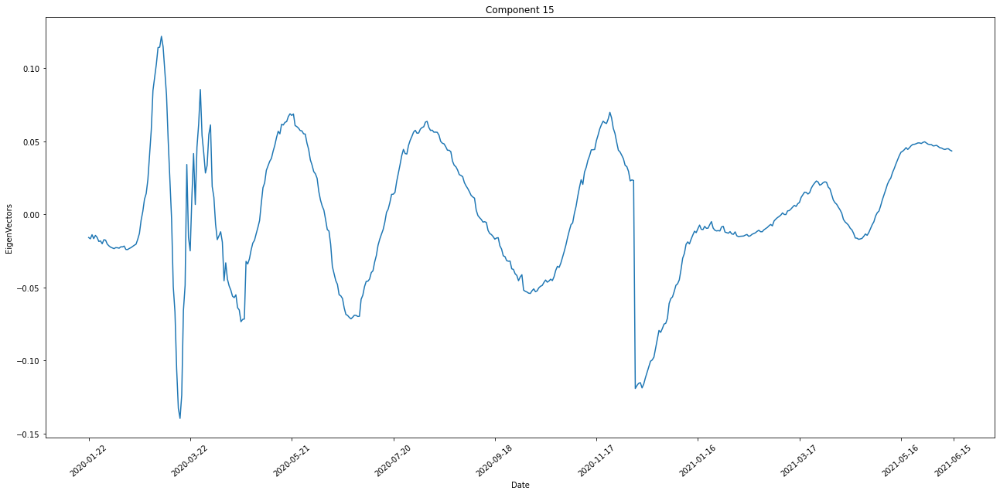

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


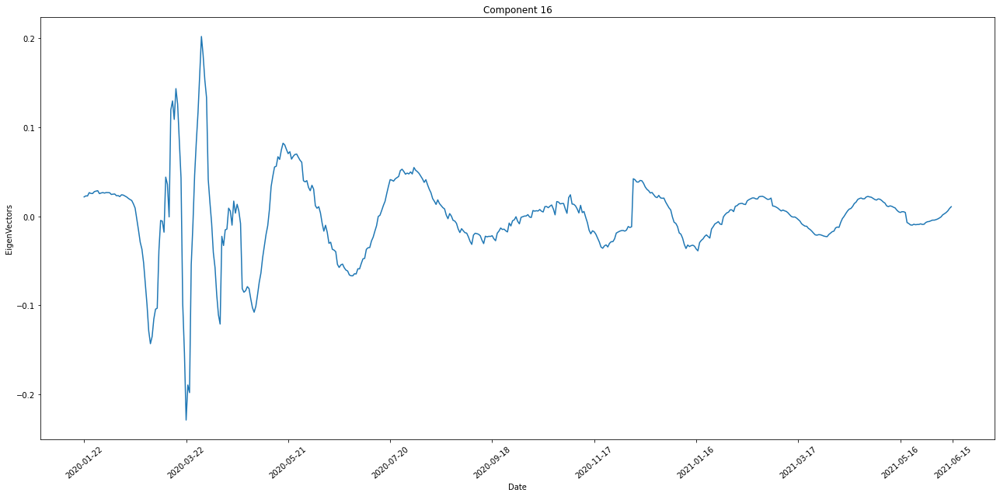

In [ ]:
#5.
for i in range(16):
  figl, ax = plt.subplots(figsize = (22,10))
  ax.plot(scaled_data.columns, eigenVectors[:, i])
  xticks=list(range(0, len(scaled_data.columns), 60))
  xlabels=[scaled_data.columns[x] for x in xticks]
  xticks.append(len(scaled_data.columns))
  xlabels.append(scaled_data.columns[-1])
  ax.set_xticks(xticks)
  ax.set_xticklabels(xlabels, rotation=40)
  ax.set_title('Component ' + str(i+1))
  ax.set_xlabel('Date')
  ax.set_ylabel('EigenVectors')
  plt.show()

6. Component 1-4 hold the top 4 largest eigenvalues. From part4, these four eigenvectors and eigenvalues store the more than 99% of the variance and the most information of the data. Besides, these four cuvers are smooth and simple, expecially for the component 1 and 2 whose curves are monotonic. As the smaller the eigenvalues are, the curve goes up and down recurrently by the same ammount, and all the curves follow the similar pattern: mean reversion(mean is equal to zero). Each principal component represent a different transformation of the data features. Thus, we could use the appropriate number of the principal components to describe the data features. For examples, 4 principal components to meet the 99% variance criteria and save the most information of the data.

# Part 3: Data reconstruction [3 Marks]

Create a function that:

*   Accepts a country and the original dataset as inputs.
*   Calls useful functions that you designed in previous parts to compute eigen vectors and eigen values. 
*   Plots 4 figures:
  1.   The original time-series for the specified country. **[0.5]**
  2.   The incremental reconstruction of the **original** (not standardized) time-series for the specified country in a single plot. **[1.5]**
       * You should at least show 5 curves in a figure for incremental reconstruction. For example, you can pick the following (or any other combination that you think is reasonable): 
          * Reconstruction with only PC1
          * Reconstruction with both PC1 and PC2
          * Reconstruction with PC1 to PC4 (First 4 PCs)
          * Reconstruction with PC1 to PC8 (First 8 PCs)
          * Reconstruction with PC1 to PC16 (First 16 PCs)

      * Hint: you need to compute the reconstruction for the standardized time-series first, and then scale it back to the original (non-standardized form) using the StandardScaler `inverse_transform` [help...](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler.inverse_transform)
  3.   The residual error for your best reconstruction with respect to the original time-series. **[0.5]**
      * Hint: You are plotting the error that we have for reconstructing each day `(df - df_reconstructed)`. On the x-axis, you have dates, and on the y-axis, the residual error. 
  4.   The RMSE of the reconstruction as a function of the number of included components (x-axis is the number of components and y-axis is the RMSE). Sweep x-axis from 1 to 10 (this part is independent from part 3.2.) **[1]**

Test your function using the `US`, `Canada`, and `China` as inputs. **[0.5]**


In [ ]:
from sklearn.preprocessing import StandardScaler
def plot_country_figures(original_df, country_name):
  #plot the original time-series for the specified country.
  figl, ax = plt.subplots(figsize = (22,10))
  ax.plot(original_df.columns, original_df.loc[country_name])
  xticks=list(range(0, len(original_df.columns), 60))
  xlabels=[original_df.columns[x] for x in xticks]
  xticks.append(len(original_df.columns))
  xlabels.append(original_df.columns[-1])
  ax.set_xticks(xticks)
  ax.set_xticklabels(xlabels, rotation=40)
  ax.set_title('original ' + country_name)
  ax.set_xlabel('Date')
  ax.set_ylabel('Total Cases')
  plt.show()

  #scale data to scaled_data, compute eigenValues, eigenVectors
  scaler = StandardScaler()
  scaled_data = scaler.fit_transform(original_df)
  df_cov = np.cov(scaled_data.T)
  eigenValues, eigenVectors = get_sorted_eigen(df_cov)

  # performe incremental reconstruction and plot
  figl, ax = plt.subplots(figsize = (22,10))
  RMSE_list1 = []
  for i in range(5):
    W = eigenVectors[:, 0:2**i]
    proj_df = np.dot(scaled_data, W)
    Recon_df = np.dot(proj_df, W.T)
    Recon_df = scaler.inverse_transform(Recon_df)
    Recon_df = pd.DataFrame(data = Recon_df, columns = original_df.columns, index = original_df.index.values)
    #plot
    ax.plot(original_df.columns, Recon_df.loc[country_name], label= 'PC1 to PC'+str(2**i))
    MSE = sum((original_df.loc[country_name] - Recon_df.loc[country_name])**2)/len(Recon_df.loc[country_name])
    rmse = np.sqrt(MSE)
    RMSE_list1.append(rmse)
  plt.legend()
  ax.set_xticks(xticks)
  ax.set_xticklabels(xlabels, rotation=40)
  ax.set_title(country_name)
  ax.set_xlabel('Date')
  ax.set_ylabel('Total Cases')
  plt.show()

  #best recon 
  index = np.argmin(RMSE_list1)
  W = eigenVectors[:, 0:2**index]
  proj_df = np.dot(scaled_data, W)
  Recon_df = np.dot(proj_df, W.T)
  Recon_df = scaler.inverse_transform(Recon_df)
  Recon_df = pd.DataFrame(data = Recon_df, columns = original_df.columns, index = original_df.index.values)
  #plot
  figl, ax = plt.subplots(figsize = (22,10))
  ax.plot(original_df.loc[country_name] - Recon_df.loc[country_name])
  ax.set_xticks(xticks)
  ax.set_xticklabels(xlabels, rotation=40)
  ax.set_title('Best recon is: '+'PC1 to PC'+str(2**index))
  ax.set_xlabel('Date')
  ax.set_ylabel('Error')
  plt.show()

  # RMSE
  RMSE_list2 = []
  for i in range(1, 11):
    W = eigenVectors[:, 0:i+1]
    proj_df = np.dot(scaled_data, W)
    Recon_df = np.dot(proj_df, W.T)
    Recon_df = scaler.inverse_transform(Recon_df)
    Recon_df = pd.DataFrame(data = Recon_df, columns = original_df.columns, index = original_df.index.values)
    MSE = sum((original_df.loc[country_name] - Recon_df.loc[country_name])**2)/len(Recon_df.loc[country_name])
    rmse = np.sqrt(MSE)
    RMSE_list2.append(rmse)
  plt.figure(figsize = (10,5))
  plt.plot(range(1,11), RMSE_list2, 'b-o')
  plt.title('RMSE curve')
  plt.xlabel('Number of components')
  plt.ylabel('RMSE')

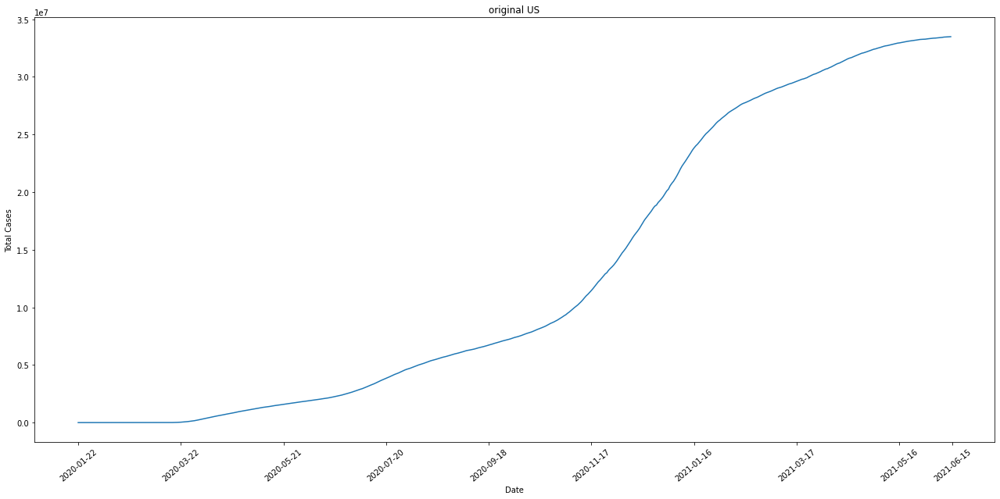

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


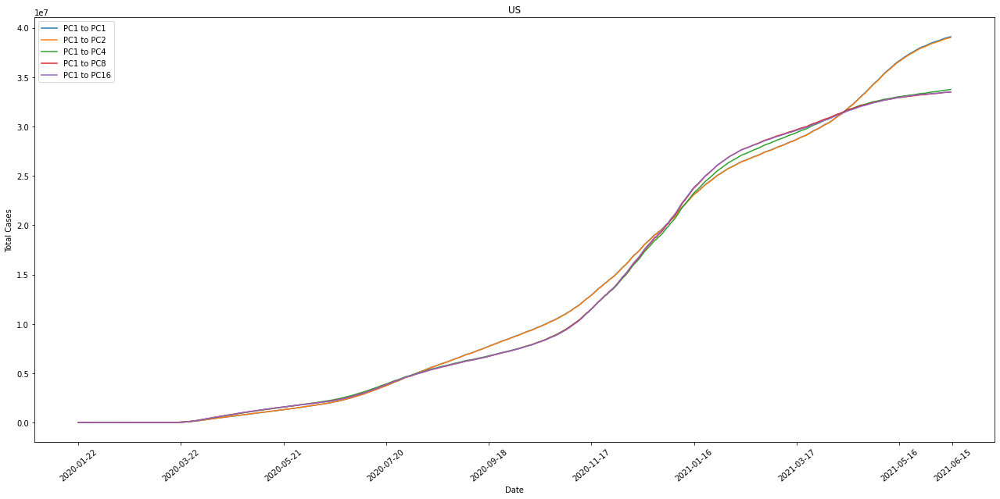

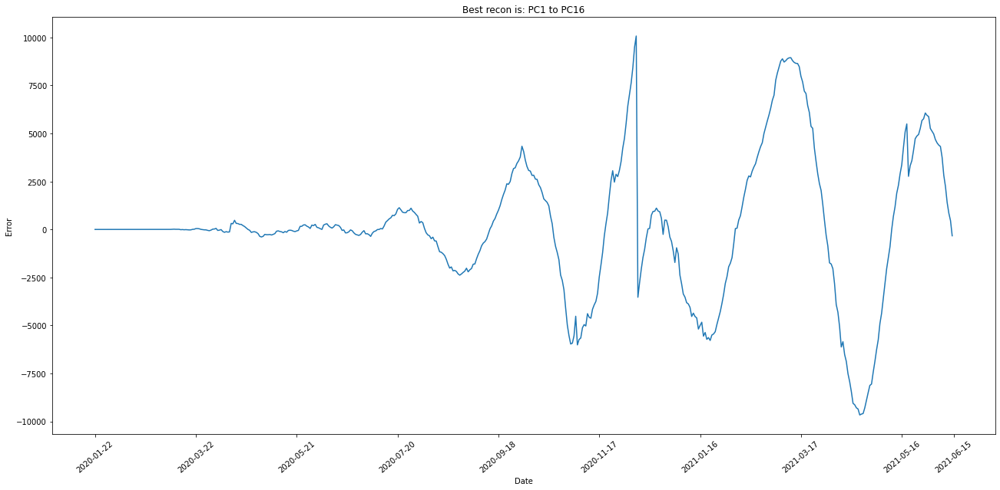

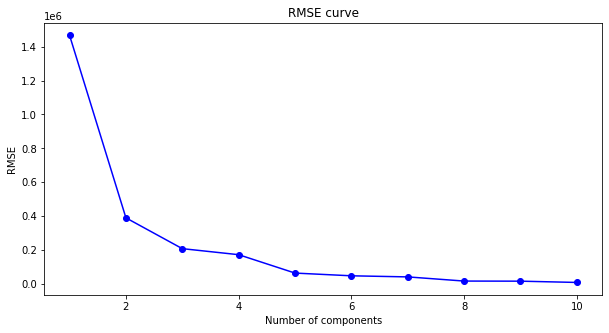

In [ ]:
plot_country_figures(df, 'US')

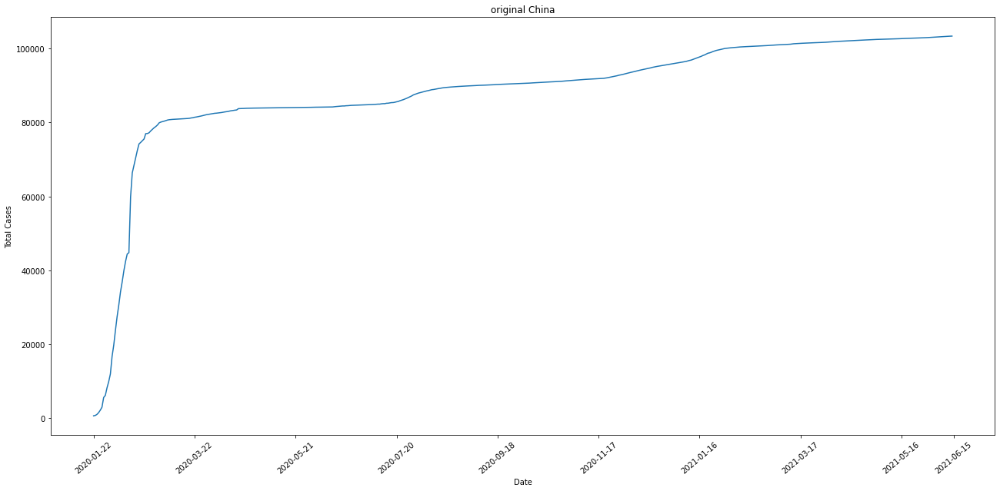

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


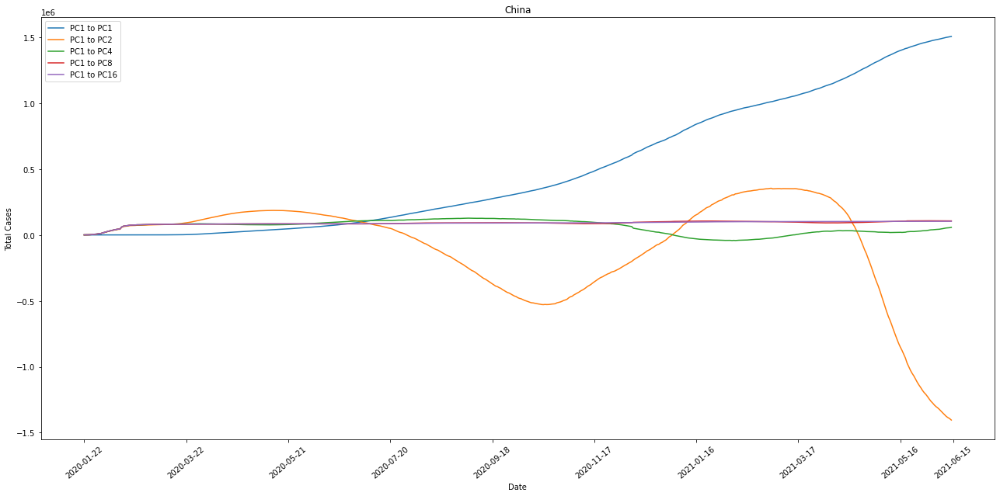

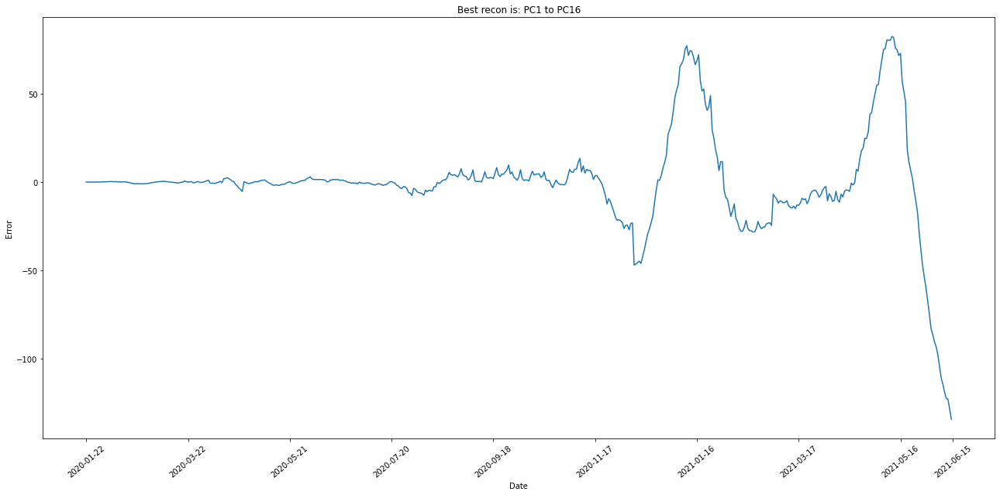

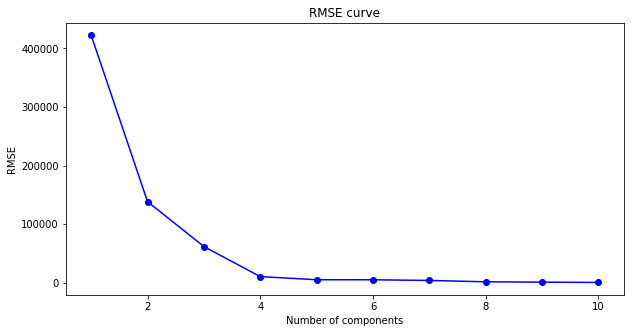

In [ ]:
plot_country_figures(df, 'China')

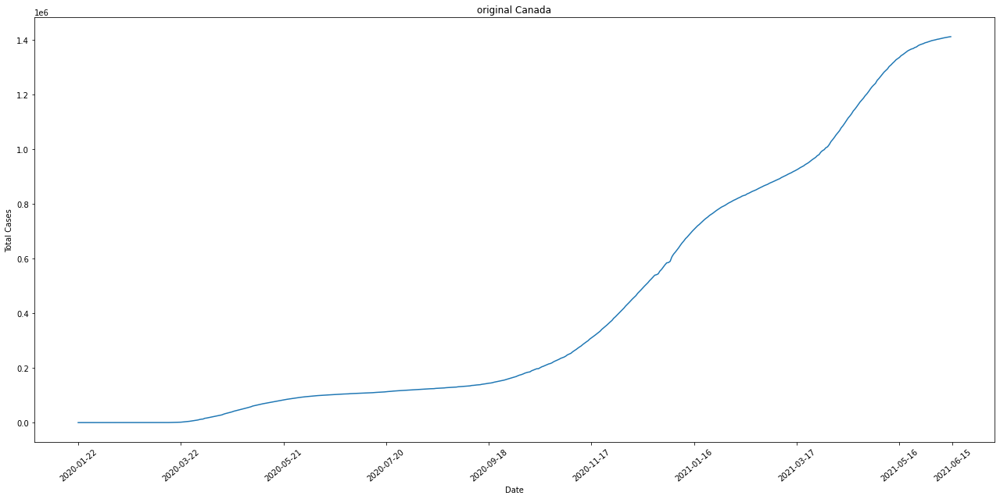

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


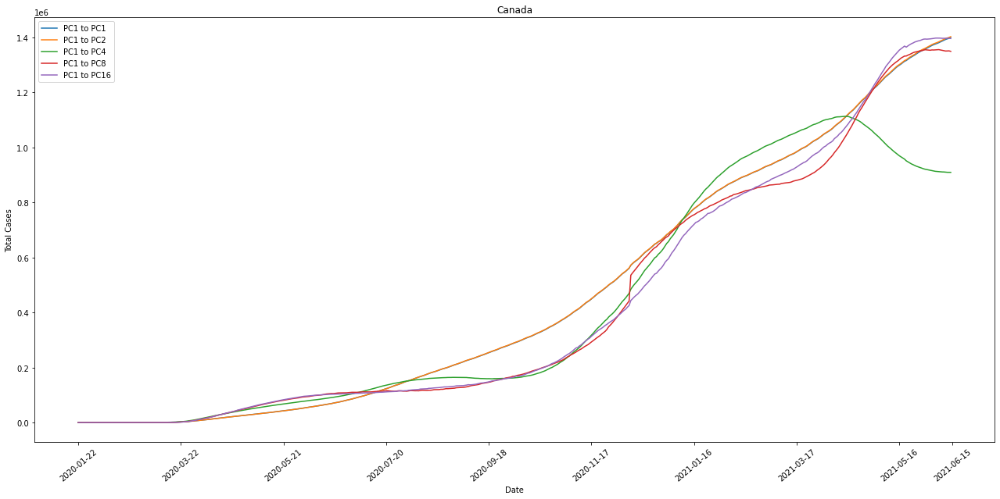

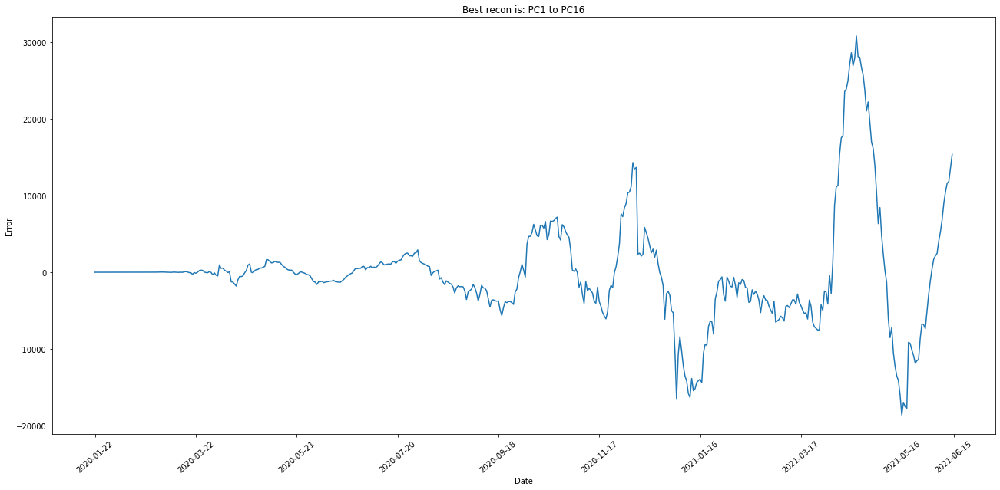

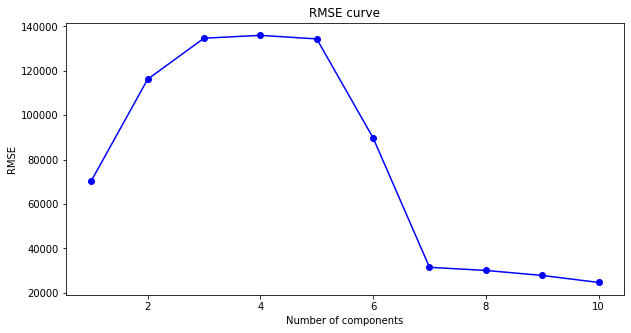

In [ ]:
plot_country_figures(df, 'Canada')

# Part 4: SVD [2 Marks]
Modify your code in part 3 to use SVD instead of PCA for extracting the eigenvectors. **[1]**

Explain if standardization or covariance computation is required for this part.
Repeat part 3 and compare your PCA and SVD results. **[1]**



In [ ]:
def plot_country_figures_SVD(original_df, country_name):
  #plot the original time-series for the specified country.
  figl, ax = plt.subplots(figsize = (22,10))
  ax.plot(original_df.columns, original_df.loc[country_name])
  xticks=list(range(0, len(original_df.columns), 60))
  xlabels=[original_df.columns[x] for x in xticks]
  xticks.append(len(original_df.columns))
  xlabels.append(original_df.columns[-1])
  ax.set_xticks(xticks)
  ax.set_xticklabels(xlabels, rotation=40)
  ax.set_title('original ' + country_name)
  ax.set_xlabel('Date')
  ax.set_ylabel('Total Cases')
  plt.show()

  U, S, V = np.linalg.svd(original_df)
  
  # performe incremental reconstruction and plot
  figl, ax = plt.subplots(figsize = (22,10))
  RMSE_list1 = []
  for i in range(5):
    u = U[:,0:i**2]
    v = V[0:i**2,:]
    Recon_df = S[0:i**2]*u@v
    Recon_df = pd.DataFrame(data = Recon_df, columns = original_df.columns, index = original_df.index.values)
    #plot
    ax.plot(original_df.columns, Recon_df.loc[country_name], label= 'PC1 to PC'+str(2**i))
    MSE = sum((original_df.loc[country_name] - Recon_df.loc[country_name])**2)/len(Recon_df.loc[country_name])
    rmse = np.sqrt(MSE)
    RMSE_list1.append(rmse)
  plt.legend()
  ax.set_xticks(xticks)
  ax.set_xticklabels(xlabels, rotation=40)
  ax.set_title(country_name)
  ax.set_xlabel('Date')
  ax.set_ylabel('Total Cases')
  plt.show()

  #best recon 
  index = np.argmin(RMSE_list1)
  u = U[:,0:index**2]
  v = V[0:index**2,:]
  Recon_df = S[0:index**2]*u@v
  Recon_df = pd.DataFrame(data = Recon_df, columns = original_df.columns, index = original_df.index.values)
  #plot
  figl, ax = plt.subplots(figsize = (22,10))
  ax.plot(original_df.loc[country_name] - Recon_df.loc[country_name])
  ax.set_xticks(xticks)
  ax.set_xticklabels(xlabels, rotation=40)
  ax.set_title('Best recon is: '+'PC1 to PC'+str(2**index))
  ax.set_xlabel('Date')
  ax.set_ylabel('Error')
  plt.show()

  # RMSE
  RMSE_list2 = []
  for i in range(1, 11):
    u = U[:,0:i**2]
    v = V[0:i**2,:]
    Recon_df = S[0:i**2]*u@v
    Recon_df = pd.DataFrame(data = Recon_df, columns = original_df.columns, index = original_df.index.values)
    MSE = sum((original_df.loc[country_name] - Recon_df.loc[country_name])**2)/len(Recon_df.loc[country_name])
    rmse = np.sqrt(MSE)
    RMSE_list2.append(rmse)
  plt.figure(figsize = (10,5))
  plt.plot(range(1,11), RMSE_list2, 'b-o')
  plt.title('RMSE curve')
  plt.xlabel('Number of components')
  plt.ylabel('RMSE')

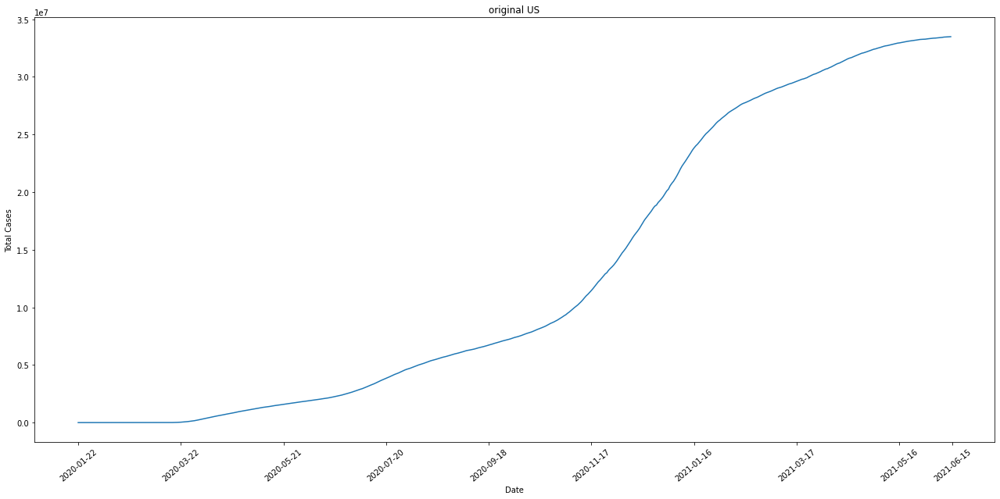

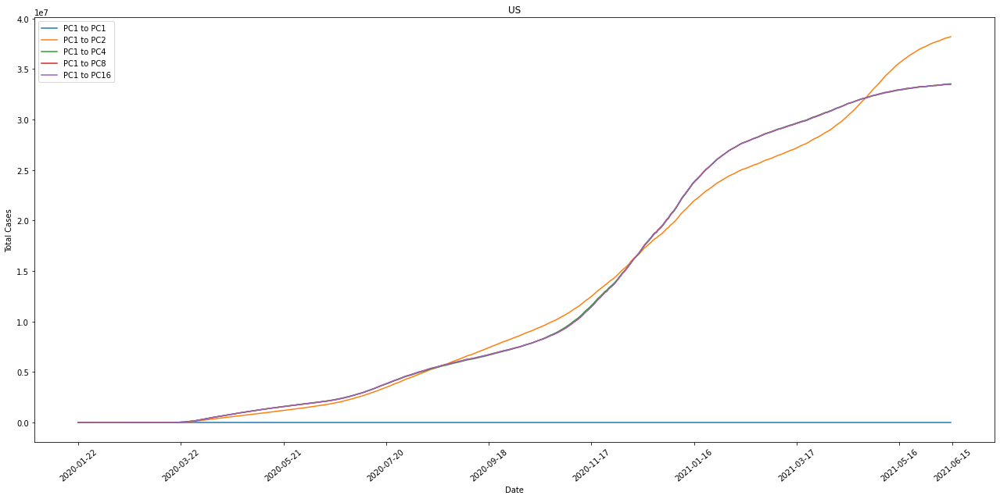

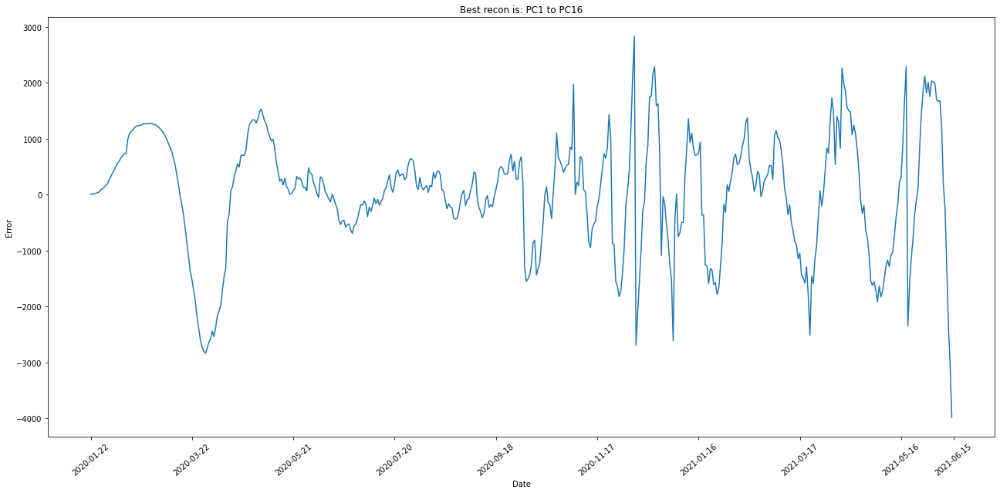

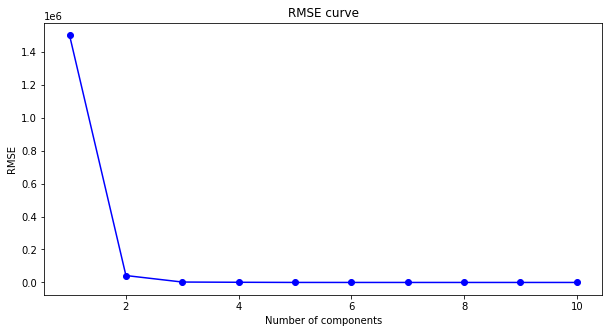

In [ ]:
plot_country_figures_SVD(df, 'US')

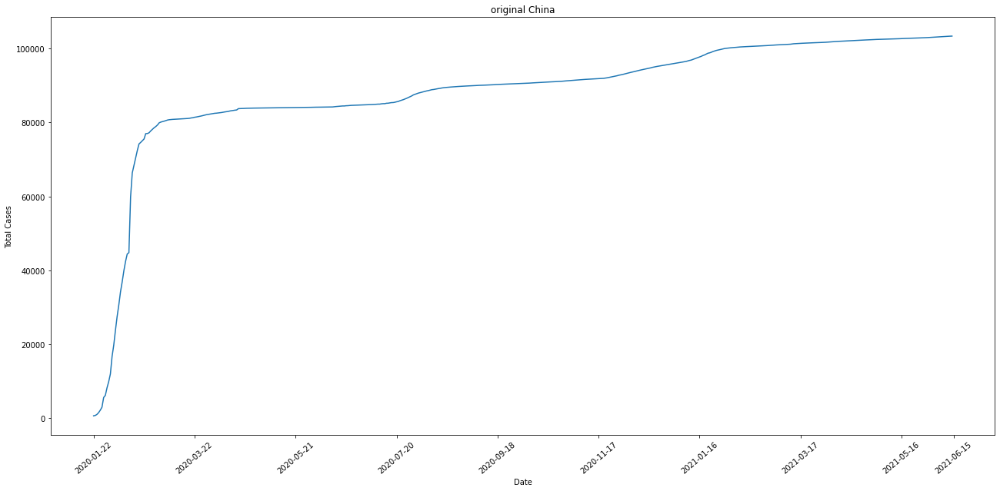

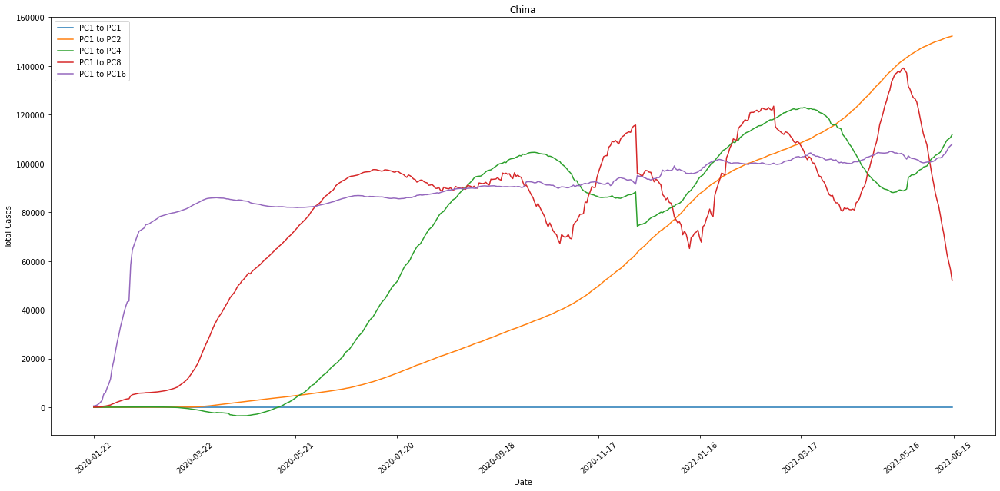

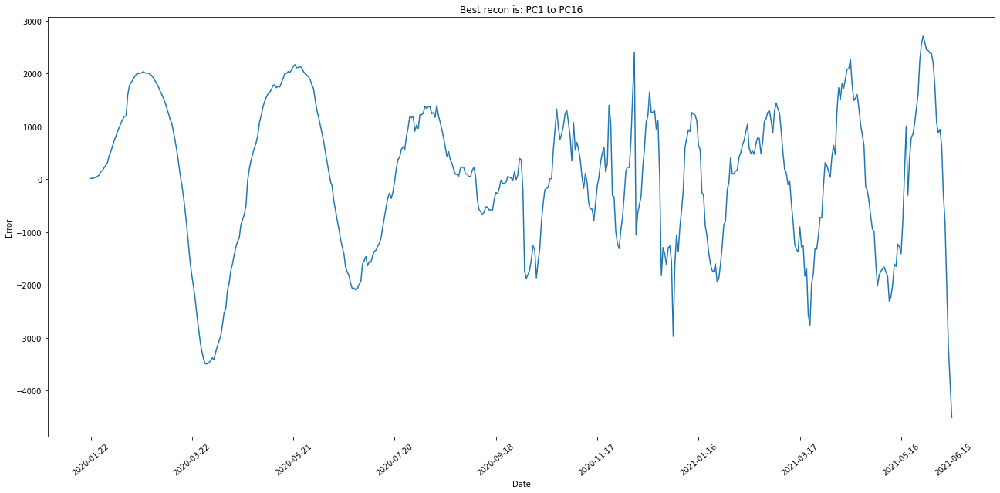

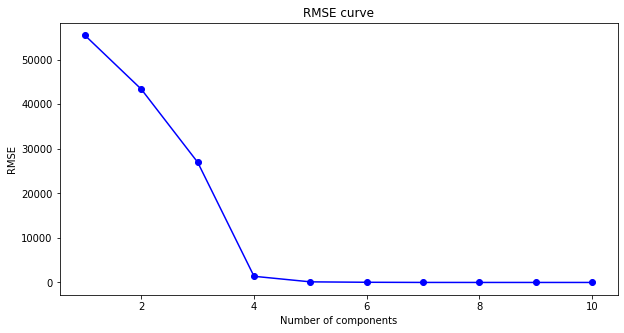

In [ ]:
plot_country_figures_SVD(df, 'China')

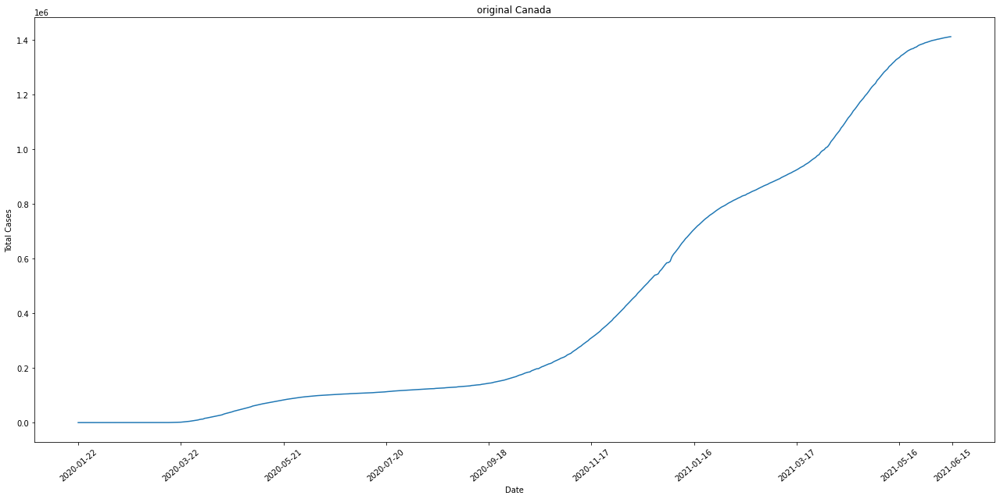

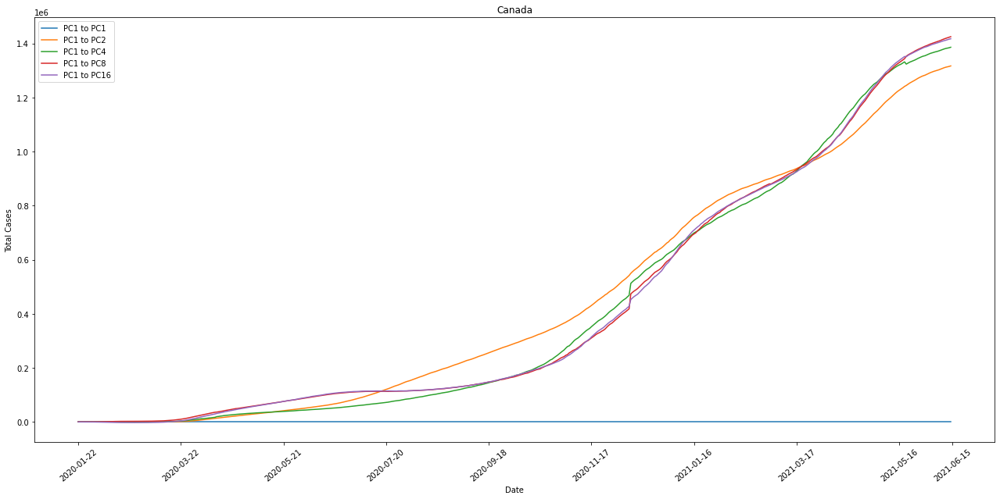

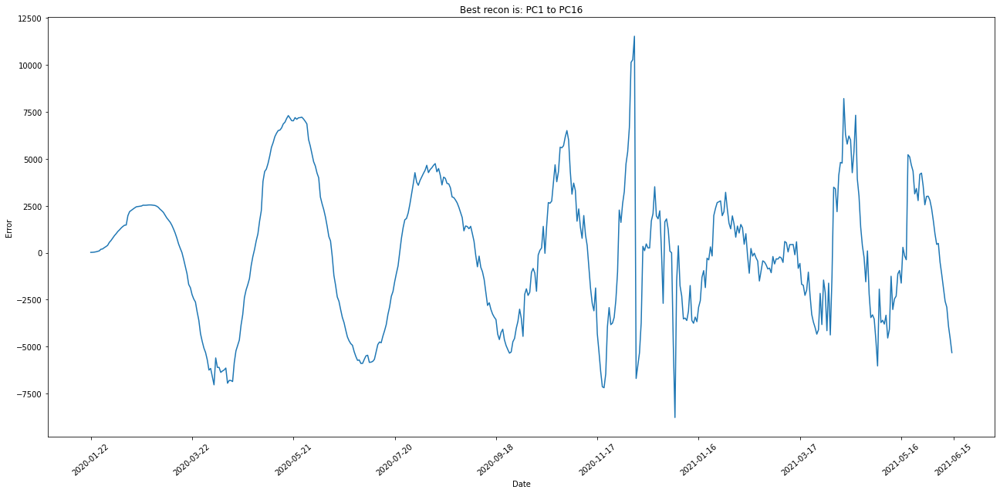

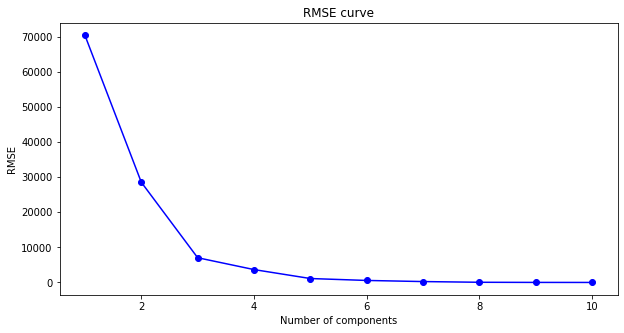

In [ ]:
plot_country_figures_SVD(df, 'Canada')

We do not need to apply standardization and covariance matrix. SVD dose not need to do eigen decomposition on the covariance matrix because SVD can be much more efficient and is able to handle sparse matrices. In addition, there are reduced forms of SVD which are even more economic to compute[1]. In PCA, which uses the eigendecomposition on covariance matrix(C = 1/m X*X.T), needs to perform standardization to prevent over-capture of certain features with large values. But SVD uses A.T*A eigendecomposition to perfrom feature extraction and elimination directly from the original data matrix A. 

It seems SVD has better perofrmance on RMSE than PCA whose average RMSE is greatre than SVD's and reaches 0 slower than SVD. It means although SVD has a larger computation cost, it has the better performance. Reason: SVD is more stable than PCA, because PCA need to compute X*X.T，for some matrix，the covariance matrix of them will lose some percision. For example Lauchli matrix. SVD perform eigendecompostion based on original matrix directly, therefore, it could capture more features and more percisely.

[1]: https://towardsdatascience.com/pca-and-svd-explained-with-numpy-5d13b0d2a4d8

# Part 5: Let's collect a more recent dataset! [2 Marks]
Create a more recent dataset similar to the one provided in your handout using the raw information provided [here](https://datahub.io/core/covid-19#resource-time-series-19-covid-combined). **[1]**

You need to manipulate the data to organize it in the desired format. You are free to use any tools you like, from Excel to Python!
 
In the end, you should have a new CSV file with more dates (features) compared to the provided dataset. 


Upload your new dataset (in CSV format) to your colab notebook and repeat part 4. **[1]**


Don't forget to add your new CSV file to your GitHub repo. The code below helps you to upload your new CSV file to your colab session. 




In [ ]:
new_data = pd.read_csv('time-series-19-covid-combined_csv.csv')

In [ ]:
full_grouped = new_data.groupby(['Date', 'Country/Region'])['Confirmed'].sum().reset_index()
group = full_grouped.groupby('Date')
Date_list = new_data['Date'][: sum(new_data['Country/Region'] == 'Afghanistan')]

for count, item in enumerate(group):
  country_list = item[1]['Country/Region'].values
  break
new_df = pd.DataFrame(columns = Date_list, index = country_list)

for count, item in enumerate(group):
  new_df.iloc[:, count] = item[1]['Confirmed'].values
new_df.to_csv('Part5_Processed_Data.csv')


In [ ]:
# load train.csv to Google Colab
from google.colab import files
uploaded = files.upload()
new_df = pd.read_csv('Part5_Processed_Data.csv')

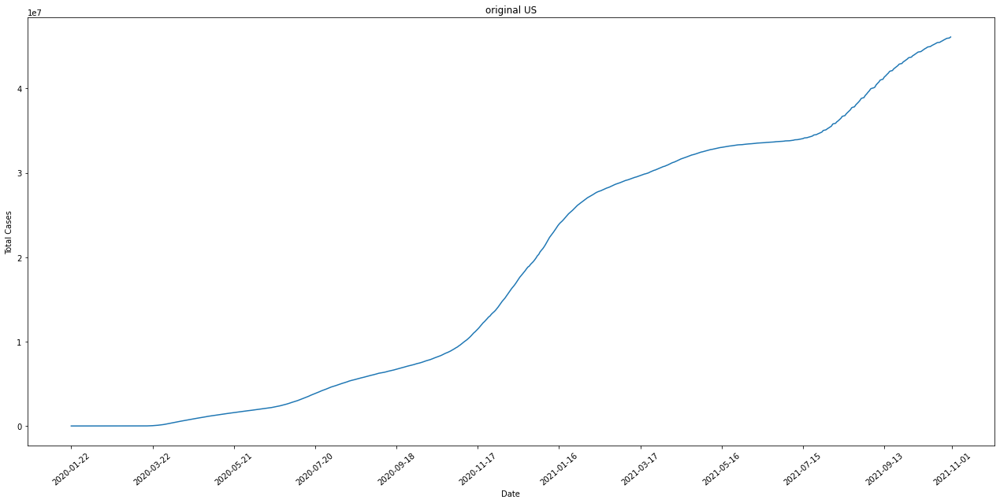

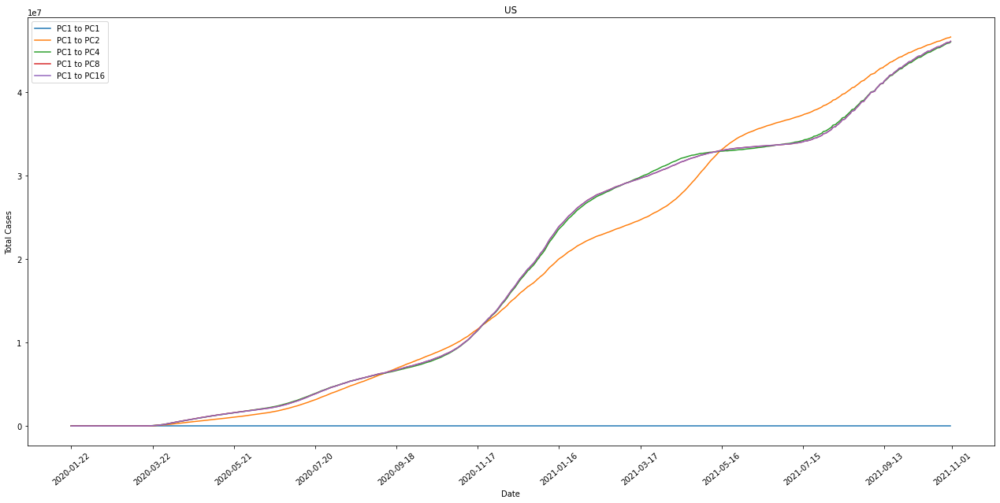

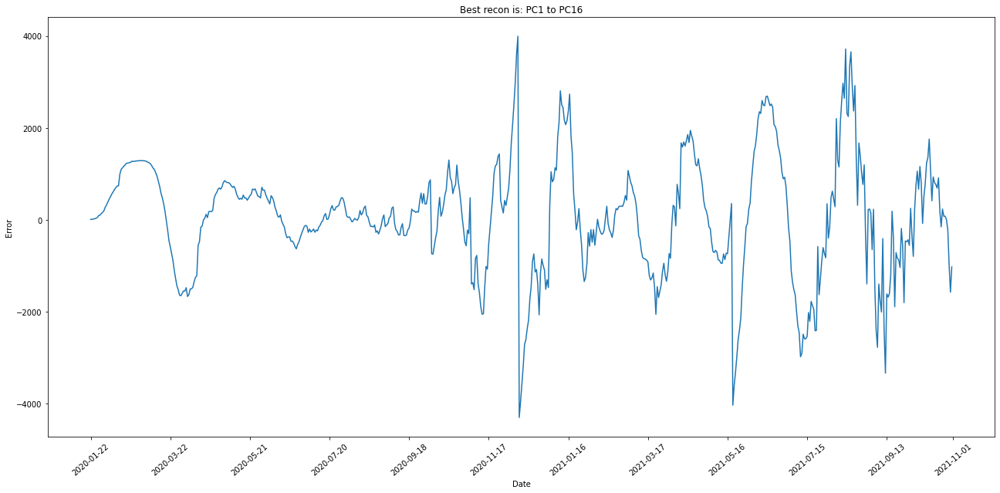

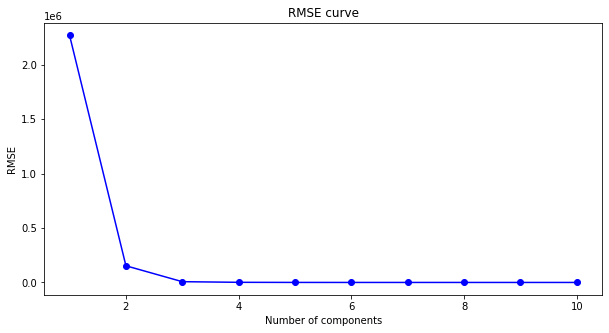

In [ ]:
plot_country_figures_SVD(new_df, 'US')

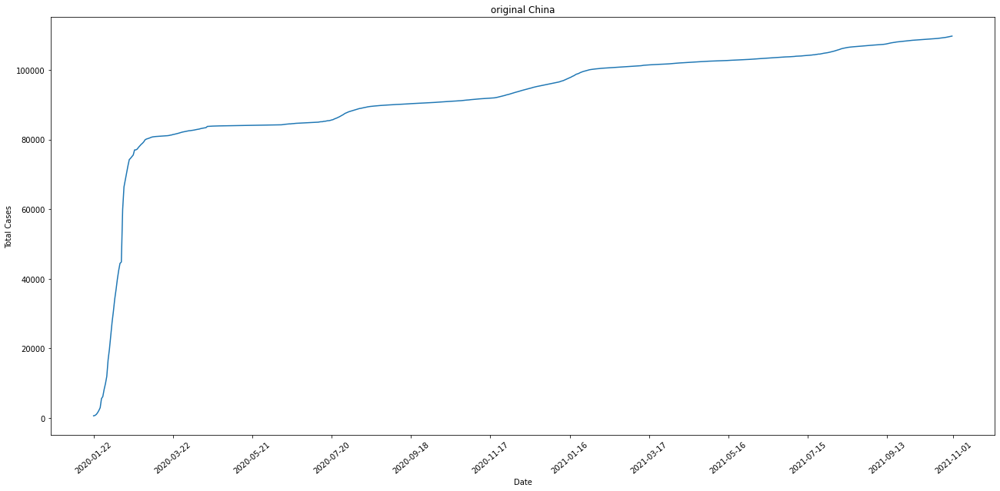

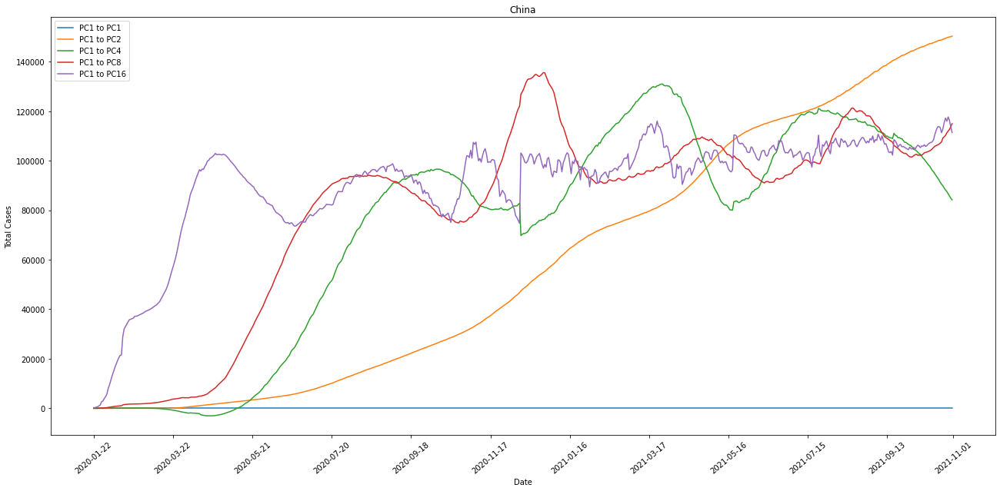

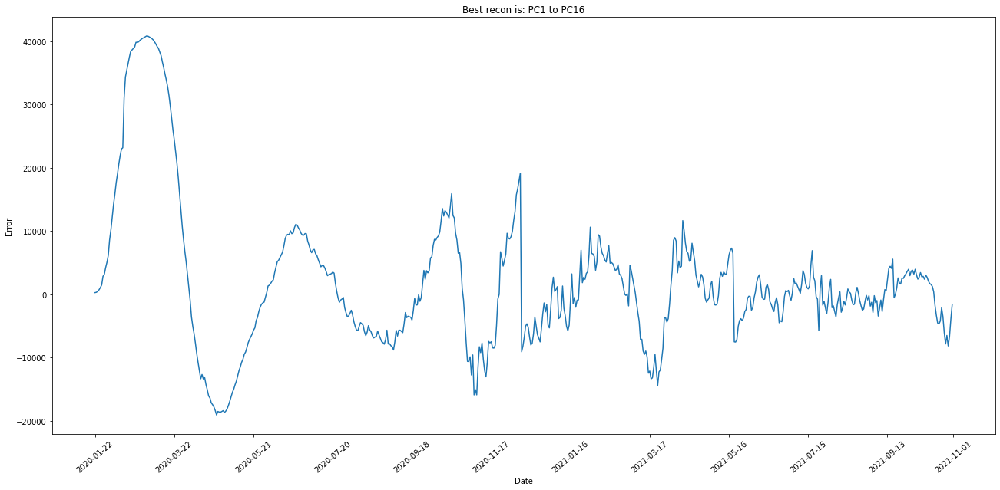

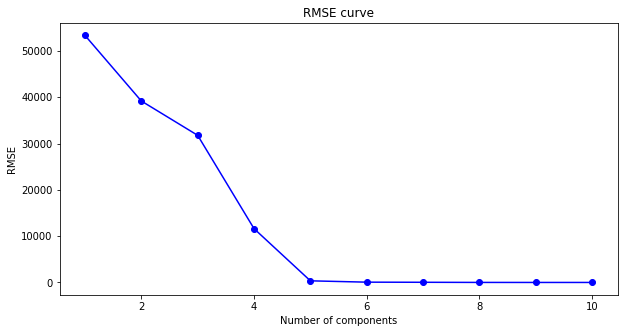

In [ ]:
plot_country_figures_SVD(new_df, 'China')

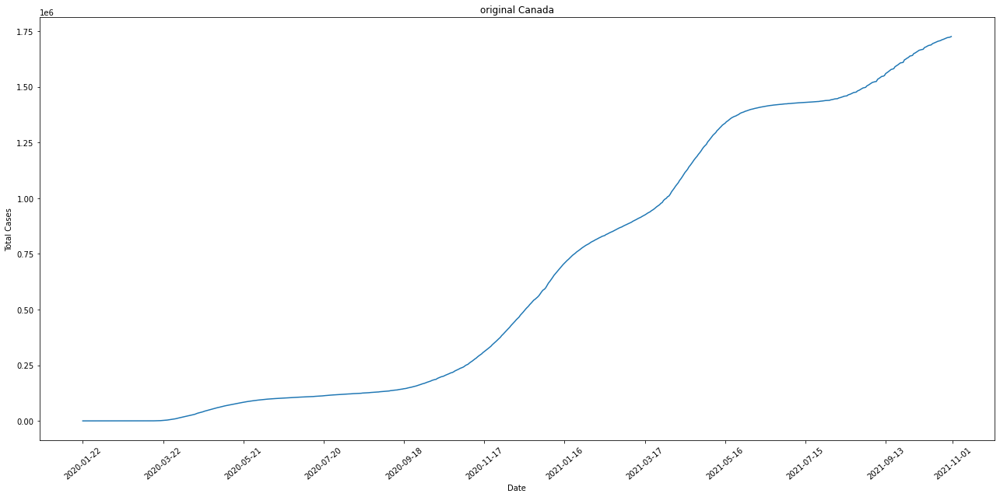

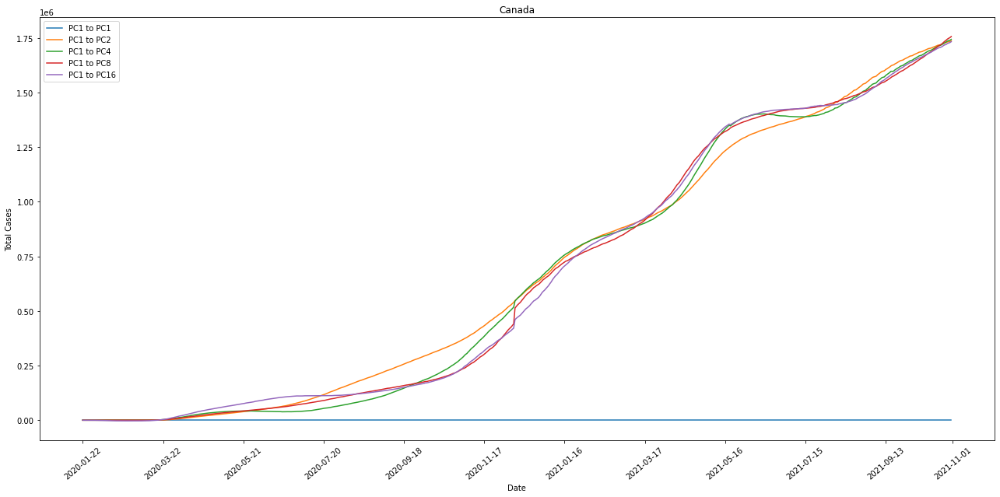

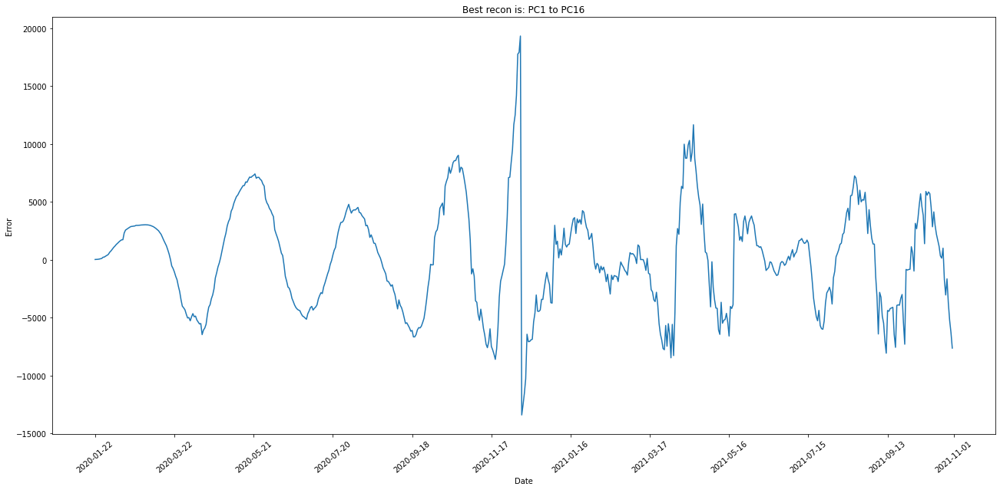

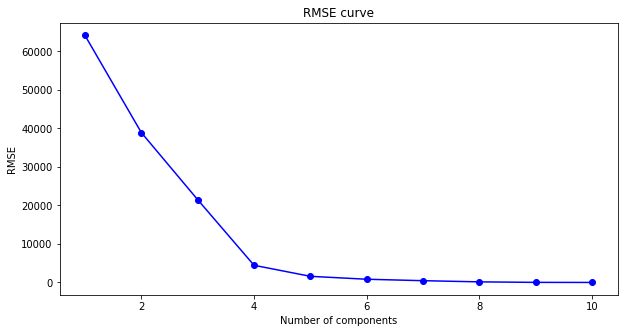

In [ ]:
plot_country_figures_SVD(new_df, 'Canada')

# References

Understanding PCA and SVD:

1. https://towardsdatascience.com/pca-and-svd-explained-with-numpy-5d13b0d2a4d8

2. https://stats.stackexchange.com/questions/134282/relationship-between-svd-and-pca-how-to-use-svd-to-perform-pca

3. https://stats.stackexchange.com/questions/2691/making-sense-of-principal-component-analysis-eigenvectors-eigenvalues

4. https://hadrienj.github.io/posts/Deep-Learning-Book-Series-2.8-Singular-Value-Decomposition/

PCA:

1. Snippets from: https://plot.ly/ipython-notebooks/principal-component-analysis/

2. https://www.value-at-risk.net/principal-component-analysis/

Covid Data:

1. https://www.worldometers.info/coronavirus/

2. https://datahub.io/core/covid-19#resource-time-series-19-covid-combined

